#Objetivos y análisis introductorio de datos


El objetivo de este proyecto es entender cuales son las variables que hacen que se desarolle un incendio y el tamaño del mismo, así como conocer que tipo de vegetación es más propenso a sufrir este tipo de eventos y, mediante las tecnicas de machine learning podemos estimar cual es la mejor forma obtener las respuestas para conocer lo planteado. Analizaremos las principales varibles, sus correlaciones para ayudar a responder los siguientes interrogantes:

* ¿Qué tipo de vegetación presenta más o menos incidencia de incendios forestales?
* Cuál es la importancia de la vegetación y clima, para determinar el tamaño del incencio?
* Cuales son las caracteristicas que tienen los estados mas propensos a subrir estos eventos?
* Cuales son los incendios más catastróficos y como los podemos predecir?
* ¿Existe alguna tendencia de incremento de incendios?
* Aplicaremos un algoritmo de clasificación que nos ayude a entender cuales son las categorías de incendios que más ocurren y porque.



In [167]:
#Importamos librerias 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn import tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn import utils
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import plotly.express as px
import urllib.request
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression

In [168]:
#Cargamos el data set
df = pd.read_csv("F:/Data Science/Coder/DATA SET/U.S. Wildfire data (plus other attributes)/FW_Veg_Rem_Combined.csv")
df.head()

,Unnamed: 0.1,Unnamed: 0,fire_name,fire_size,fire_size_class,stat_cause_descr,latitude,longitude,state,disc_clean_date,...,Wind_cont,Hum_pre_30,Hum_pre_15,Hum_pre_7,Hum_cont,Prec_pre_30,Prec_pre_15,Prec_pre_7,Prec_cont,remoteness
0,0,0,NaN,10.0,C,Missing/Undefined,18.105072,-66.753044,PR,2/11/2007,...,3.250413,78.216590,76.793750,76.381579,78.724370,0.0,0.0,0.0,0.0,0.017923
1,1,1,NaN,3.0,B,Arson,35.038330,-87.610000,TN,12/11/2006,...,2.122320,70.840000,65.858911,55.505882,81.682678,59.8,8.4,0.0,86.8,0.184355
2,2,2,NaN,60.0,C,Arson,34.947800,-88.722500,MS,2/29/2004,...,3.369050,75.531629,75.868613,76.812834,65.063800,168.8,42.2,18.1,124.5,0.194544
3,3,3,WNA 1,1.0,B,Debris Burning,39.641400,-119.308300,NV,6/6/2005,...,0.000000,44.778429,37.140811,35.353846,0.000000,10.4,7.2,0.0,0.0,0.487447
4,4,4,NaN,2.0,B,Miscellaneous,30.700600,-90.591400,LA,9/22/1999,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.0,-1.0,-1.0,-1.0,0.214633


In [169]:
#Eliminacion de columnas no utilizadas en el análisis
df=df.drop(["Unnamed: 0","Unnamed: 0.1", "disc_clean_date","cont_clean_date","disc_date_final","cont_date_final","disc_date_pre","disc_pre_month","wstation_usaf","dstation_m","wstation_wban","wstation_byear","wstation_eyear","weather_file"], axis=1)

In [170]:
#nuevo dataframe
df.head()

,fire_name,fire_size,fire_size_class,stat_cause_descr,latitude,longitude,state,discovery_month,putout_time,disc_pre_year,...,Wind_cont,Hum_pre_30,Hum_pre_15,Hum_pre_7,Hum_cont,Prec_pre_30,Prec_pre_15,Prec_pre_7,Prec_cont,remoteness
0,NaN,10.0,C,Missing/Undefined,18.105072,-66.753044,PR,Feb,NaN,2007,...,3.250413,78.216590,76.793750,76.381579,78.724370,0.0,0.0,0.0,0.0,0.017923
1,NaN,3.0,B,Arson,35.038330,-87.610000,TN,Dec,NaN,2006,...,2.122320,70.840000,65.858911,55.505882,81.682678,59.8,8.4,0.0,86.8,0.184355
2,NaN,60.0,C,Arson,34.947800,-88.722500,MS,Feb,NaN,2004,...,3.369050,75.531629,75.868613,76.812834,65.063800,168.8,42.2,18.1,124.5,0.194544
3,WNA 1,1.0,B,Debris Burning,39.641400,-119.308300,NV,Jun,0 days 00:00:00.000000000,2005,...,0.000000,44.778429,37.140811,35.353846,0.000000,10.4,7.2,0.0,0.0,0.487447
4,NaN,2.0,B,Miscellaneous,30.700600,-90.591400,LA,Sep,NaN,1999,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.0,-1.0,-1.0,-1.0,0.214633


In [171]:
#Vemos distintos datos del data set
df.describe().T

,count,mean,std,min,25%,50%,75%,max
fire_size,55367.0,2104.645161,14777.005364,0.510000,1.200000,4.000000,20.000000,606945.000000
latitude,55367.0,36.172866,6.724348,17.956533,32.265960,34.600000,38.975235,69.849500
longitude,55367.0,-94.757971,15.878194,-165.936000,-102.541513,-91.212359,-82.847500,-65.285833
disc_pre_year,55367.0,2003.765474,6.584889,1991.000000,1999.000000,2005.000000,2009.000000,2015.000000
Vegetation,55367.0,11.066068,5.595719,0.000000,9.000000,12.000000,15.000000,16.000000
fire_mag,55367.0,9.414366,26.820363,0.100000,0.100000,0.100000,1.000000,100.000000
Temp_pre_30,55367.0,10.688533,10.467579,-49.210526,-1.000000,9.945559,20.015591,46.600000
Temp_pre_15,55367.0,10.800765,10.633803,-37.000000,-1.000000,10.122047,20.259329,51.567797
Temp_pre_7,55367.0,10.907171,10.807985,-20.846104,-1.000000,10.237860,20.502848,55.000000
Temp_cont,55367.0,7.838208,10.565555,-22.750000,-1.000000,0.000000,17.011853,55.000000


In [172]:
df.isnull()

,fire_name,fire_size,fire_size_class,stat_cause_descr,latitude,longitude,state,discovery_month,putout_time,disc_pre_year,...,Wind_cont,Hum_pre_30,Hum_pre_15,Hum_pre_7,Hum_cont,Prec_pre_30,Prec_pre_15,Prec_pre_7,Prec_cont,remoteness
0,True,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
1,True,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
2,True,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,True,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55362,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
55363,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
55364,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
55365,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [173]:
df.count()

fire_name           25913
fire_size           55367
fire_size_class     55367
stat_cause_descr    55367
latitude            55367
longitude           55367
state               55367
discovery_month     55367
putout_time         27477
disc_pre_year       55367
Vegetation          55367
fire_mag            55367
Temp_pre_30         55367
Temp_pre_15         55367
Temp_pre_7          55367
Temp_cont           55367
Wind_pre_30         55367
Wind_pre_15         55367
Wind_pre_7          55367
Wind_cont           55367
Hum_pre_30          55367
Hum_pre_15          55367
Hum_pre_7           55367
Hum_cont            55367
Prec_pre_30         55367
Prec_pre_15         55367
Prec_pre_7          55367
Prec_cont           55367
remoteness          55367
dtype: int64

In [174]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55367 entries, 0 to 55366
Data columns (total 29 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   fire_name         25913 non-null  object 
 1   fire_size         55367 non-null  float64
 2   fire_size_class   55367 non-null  object 
 3   stat_cause_descr  55367 non-null  object 
 4   latitude          55367 non-null  float64
 5   longitude         55367 non-null  float64
 6   state             55367 non-null  object 
 7   discovery_month   55367 non-null  object 
 8   putout_time       27477 non-null  object 
 9   disc_pre_year     55367 non-null  int64  
 10  Vegetation        55367 non-null  int64  
 11  fire_mag          55367 non-null  float64
 12  Temp_pre_30       55367 non-null  float64
 13  Temp_pre_15       55367 non-null  float64
 14  Temp_pre_7        55367 non-null  float64
 15  Temp_cont         55367 non-null  float64
 16  Wind_pre_30       55367 non-null  float6

In [175]:
df.shape

(55367, 29)

In [176]:
df.columns

Index(['fire_name', 'fire_size', 'fire_size_class', 'stat_cause_descr',
       'latitude', 'longitude', 'state', 'discovery_month', 'putout_time',
       'disc_pre_year', 'Vegetation', 'fire_mag', 'Temp_pre_30', 'Temp_pre_15',
       'Temp_pre_7', 'Temp_cont', 'Wind_pre_30', 'Wind_pre_15', 'Wind_pre_7',
       'Wind_cont', 'Hum_pre_30', 'Hum_pre_15', 'Hum_pre_7', 'Hum_cont',
       'Prec_pre_30', 'Prec_pre_15', 'Prec_pre_7', 'Prec_cont', 'remoteness'],
      dtype='object')

Resumen de los datos:

Los incendios forestales son uno de los eventos naturales económicamente más devastadores que ocurren casi regularmente. Con una gran cantidad de incendios ardiendo al mismo tiempo y recursos limitados, los administradores de tierras y los departamentos de bomberos se ven obligados a tomar decisiones difíciles sobre en qué incendio enfocarse. El objetivo de este proyecto es aprovechar el aprendizaje automático para ayudar a responder esta pregunta.

Los datos presentados corresponden a una muestra de 55367 eventos con 29 variables diferentes, es decir, que tenemos 55367 filas y 29 columnas, el data set fue encontrado en el siguiente link https://www.kaggle.com/rtatman/188-million-us-wildfires. Esta muestra comprende eventos desde 1992 hasta 2015.

En este dataset podemos observar que tenemos valores missings en 2 de las 29 columnas (fire_name y putout_date), lo que representa aproximadamente el 50% de valores faltantes en cada una de ellas.

#Análisis univariado

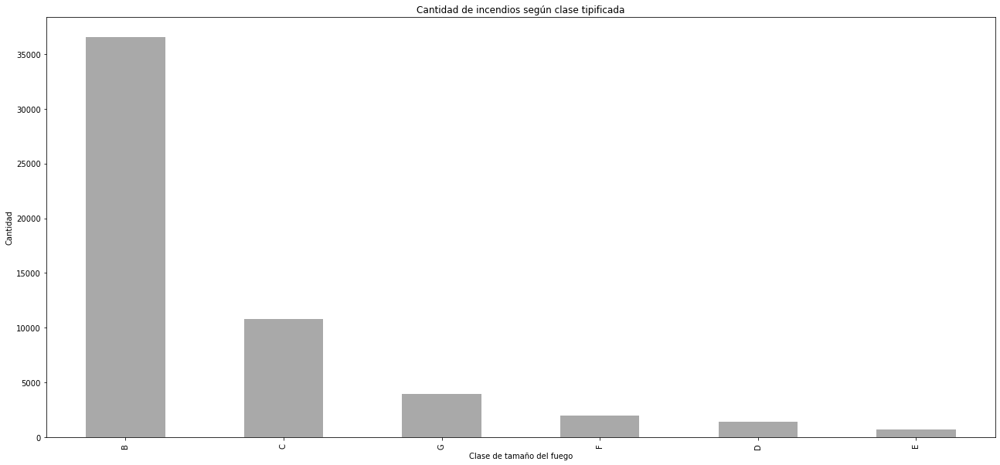

In [177]:
#Gráfico de barras por clase de fuego.
df['fire_size_class'].value_counts().plot.bar(color="darkgrey", xlabel="Clase de tamaño del fuego", ylabel="Cantidad", title="Cantidad de incendios según clase tipificada")
plt.show()

La variable fire_size_class representa la CLASE DE TAMAÑO DEL FUEGO, esto es un código (1 letra) para el tamaño del fuego basado en el número de acres (medida de superficie) dentro del perímetro final del fuego (A=mayor que 0 pero menor o igual a 0.25 acres, B=0.26-9.9 acres, C=10.0-99.9 acres, D =100-299 acres, E=300 a 999 acres, F=1000 a 4999 acres y G=5000+ acres).
En este gráfico se visualiza que desde 1992 a 2015 no hubo incendios menores (código A), mientras que la mayor cantidad de eventos fueron los del código B, entre B=0,26 - 9,9 acres.

In [178]:
#Conteo de valores x clase + creación de variable para posterior diagrama de frecuencias
clasi = df['fire_size_class'].value_counts()
clasi

B    36522
C    10811
G     3972
F     1968
D     1394
E      700
Name: fire_size_class, dtype: int64

In [179]:
#Porcentaje de clase B respecto del total
36522/55367*100


65.96348005129408

Podemos observar que la mayor cantidad de los incendios ocurridos entre 1992 y 2015, son de la clase B, es decir, casi el 66% de los eventos.

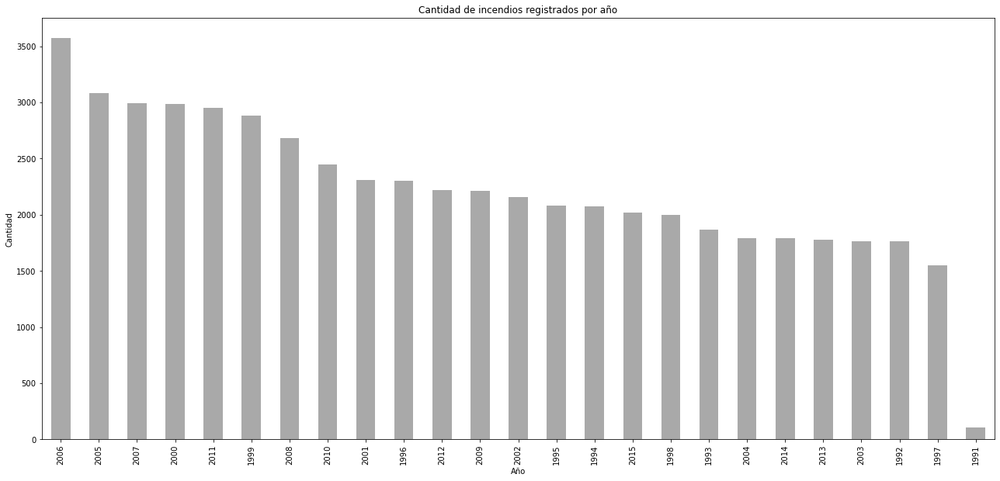

In [180]:
#Gráfico de barras conteo de incendios por año.
df['disc_pre_year'].value_counts().plot.bar(color="darkgrey", xlabel="Año", ylabel="Cantidad", title="Cantidad de incendios registrados por año")
plt.show()

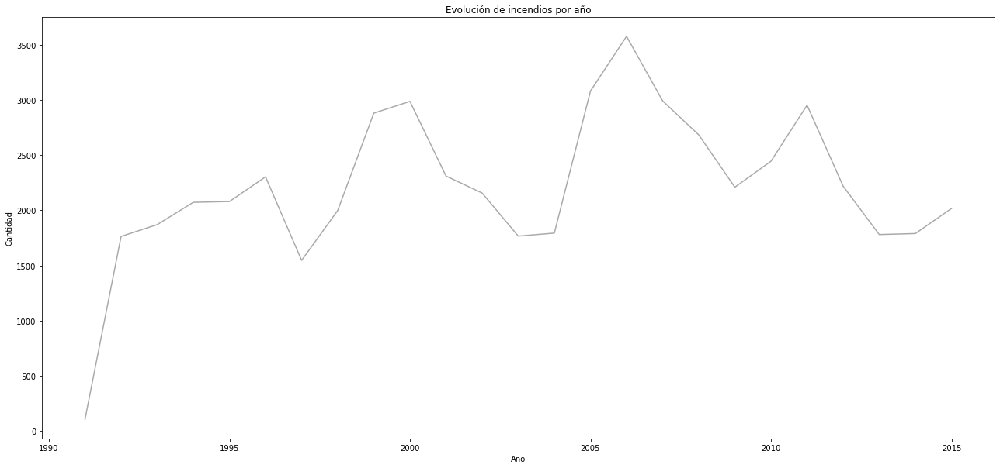

In [181]:
#Gráfico de líneas conteo de incendios por año.
df['disc_pre_year'].value_counts().sort_index().plot.line(color="darkgrey",xlabel="Año",ylabel="Cantidad",title="Evolución de incendios por año")
plt.show()

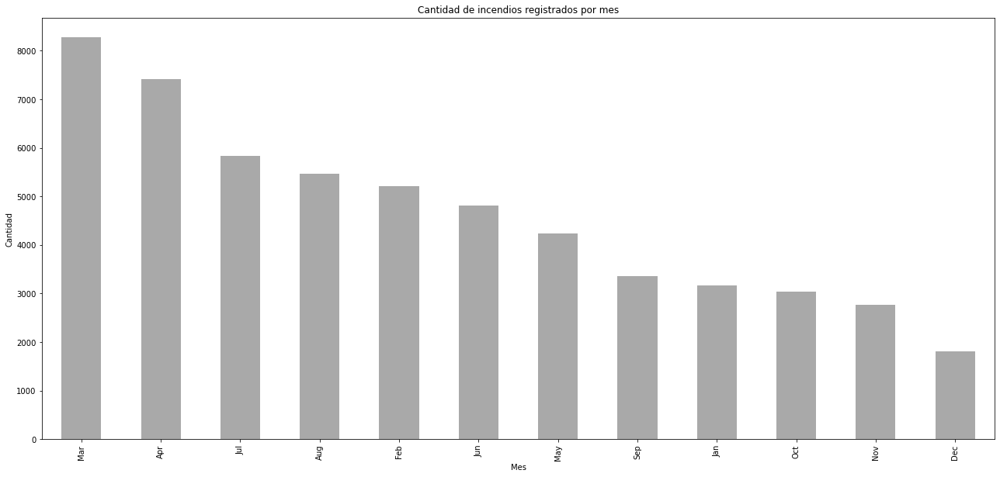

In [182]:
#Gráfico de líneas: cantidad de incendios por mes.
df['discovery_month'].value_counts().plot.bar(color="darkgrey", xlabel="Mes", ylabel="Cantidad", title="Cantidad de incendios registrados por mes")
plt.show()

En los gráficos se visualiza que en el año 2006 se producieron la mayor cantidad de incendios en Estados Unidos, siendos más de 3500 en un solo año. 
Observamos una tendencia, donde después de un aumento en la cantidad de incendios, se produce un descenso de los mismos para los años posteriores. Esto puede deberse a que se hayan utilizado más recursos para la prevención y control de incendios, haciendo que haya un "mayor control" de los incendios los años posteriores al pico.

También podemos observar que la mayor cantidad de incendios se dan en los meses de la primavera/verano en el hemisferio norte.

In [183]:
##Conteo de valores x causa + creación de variable para posterior diagrama de frecuencias
cause = df['stat_cause_descr'].value_counts()
cause

Debris Burning       14278
Arson                 9724
Miscellaneous         8344
Lightning             8218
Missing/Undefined     5063
Equipment Use         4107
Campfire              1367
Children              1280
Smoking               1181
Railroad              1021
Powerline              483
Fireworks              223
Structure               78
Name: stat_cause_descr, dtype: int64

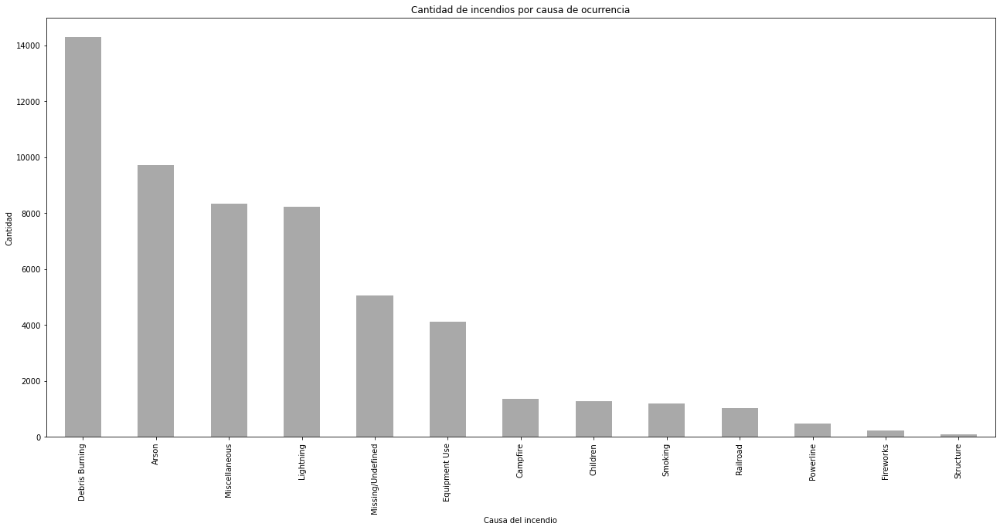

In [184]:
#Conteo de causas de todos los incendios analizados
df['stat_cause_descr'].value_counts().plot.bar(color="darkgrey", xlabel="Causa del incendio", ylabel="Cantidad", title="Cantidad de incendios por causa de ocurrencia")
plt.show()

In [185]:
#Porcentaje Debris Burning
14278/55367*100


25.78792421478498

In [186]:
#Porcentaje Arson
9724/55367*100

17.562808170932144

In [187]:
#Porcentaje Miscellaneous
8344/55367*100

15.070348763704011

Se puede visualizar que la mayor cantidad de incendios (casi un 26% del total) fueron provocados por la quema de escombros (se incluye acá a la quema de vegetación también), sorprendentemente la segunda causa de los incendios son los provocados intencionalmente (aproximadamente un 18% del total) superando incluso a las causas miscelaneas (mezcla de cosas diversas).

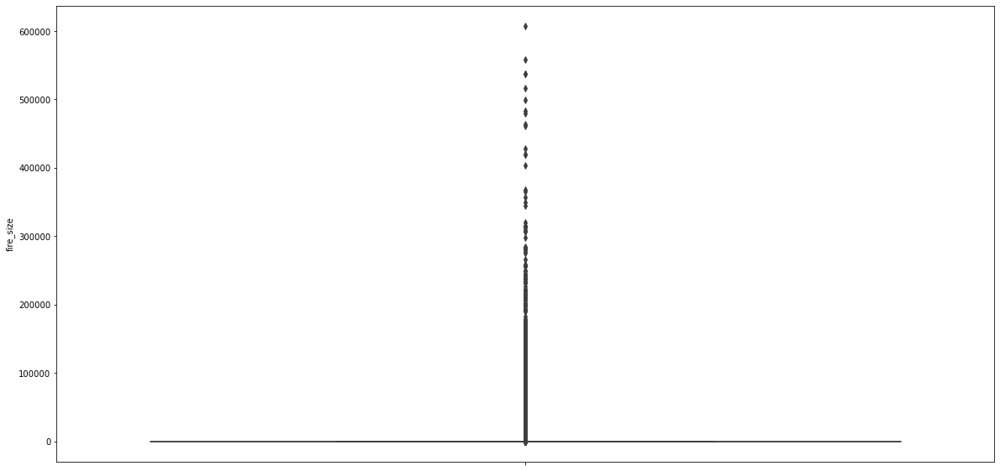

In [188]:
#Boxplot del tamaño del fuego
from seaborn import boxplot
plt.figure(figsize=(20,10))
boxplot(y=df.fire_size)
plt.show()

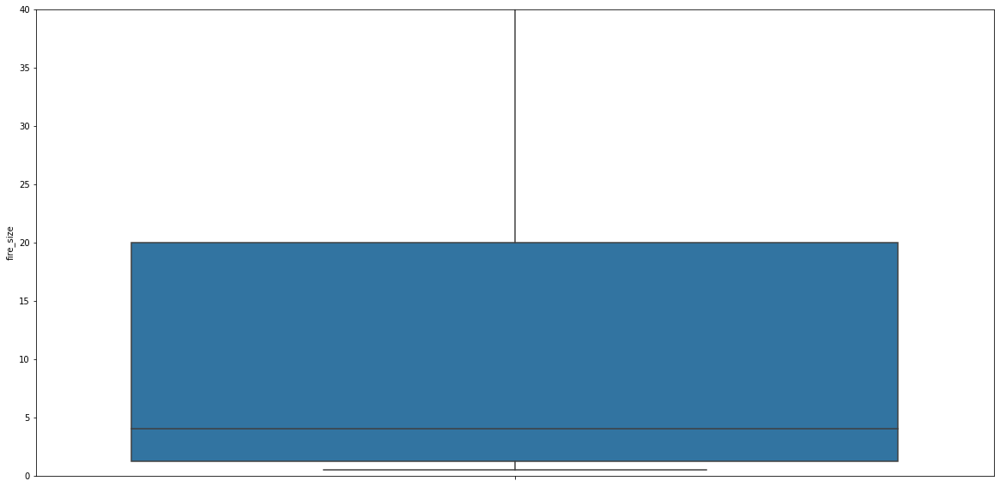

In [189]:
##Boxplot del tamaño del fuego ajustado
from seaborn import boxplot
plt.figure(figsize=(20,10))
boxplot(y=df.fire_size)
plt.ylim((0,40))
plt.show()

Como se puede observar en los dos boxplots, la mayor cantidad de eventos afectan superficies entre 0 y 20 acres, observando la mediando en aproximadamente 4 acres. También observamos que el intervalo de la caja es entre 2 y 20; siendo el intervalo de las observaciones 0 y 40. 
Esto es coincidente con el dato que teníamos respecto a la clasificación del fuego.

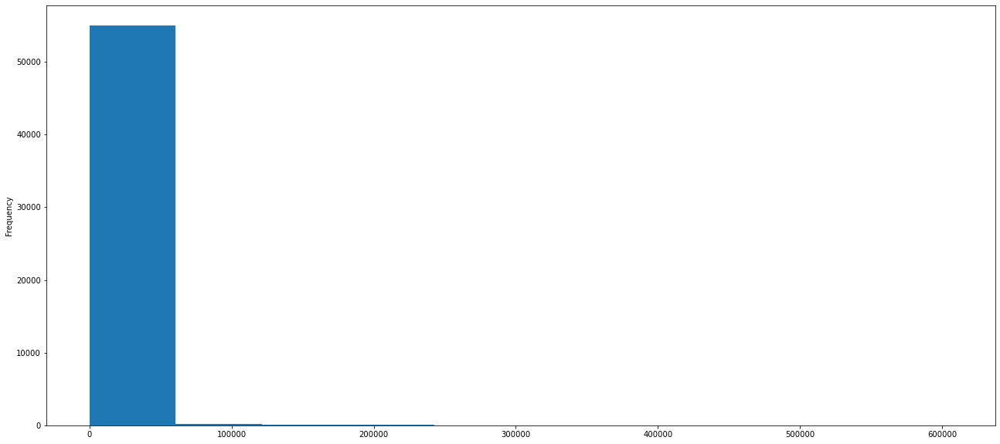

In [190]:
#Histograma del tamaño del fuego
df['fire_size'].plot.hist()
plt.show()

#Diagrama de frecuencias para las variables "fire_size_class" y "state_cause_desc"

In [191]:
#Tomamos valores de clasificación
clasi


B    36522
C    10811
G     3972
F     1968
D     1394
E      700
Name: fire_size_class, dtype: int64

In [192]:
#Tomamos valores de causas
cause

Debris Burning       14278
Arson                 9724
Miscellaneous         8344
Lightning             8218
Missing/Undefined     5063
Equipment Use         4107
Campfire              1367
Children              1280
Smoking               1181
Railroad              1021
Powerline              483
Fireworks              223
Structure               78
Name: stat_cause_descr, dtype: int64

In [193]:
#Creación de dataframes
df_clasi = pd.DataFrame(clasi)

In [194]:
df_cause = pd.DataFrame(cause)

## DIAGRAMA PARA LA CLASIFICACION DEL FUEGO

In [195]:
#Renombre dataframe de clasificación
df_clasi.rename(columns={'fire_size_class':'Frec_abs'},inplace=True)
df_clasi

,Frec_abs
B,36522
C,10811
G,3972
F,1968
D,1394
E,700


In [196]:
#Obtenemos los valores de las Frecuencias Absolutas
Frec_abs_val = df_clasi["Frec_abs"].values

#Creamos una lista vacia en donde vamos a guardar las frecuencias absolutas acumuladas
acum = []

#Iniciamos una variable en la que guardaremos los valores anteriores
valor_acum = 0

#Recorremos la lista de las frecuencias absolutas para sumarlas
for i in Frec_abs_val:
    valor_acum = valor_acum + i
    acum.append(valor_acum)
    
df_clasi["frec_abs_acum"] = acum
df_clasi

,Frec_abs,frec_abs_acum
B,36522,36522
C,10811,47333
G,3972,51305
F,1968,53273
D,1394,54667
E,700,55367


In [197]:
#Calculamos la Frecuencia Relativa en %
df_clasi["frec_rel_%"] = 100 * df_clasi["Frec_abs"]/len(df.fire_size_class)
df_clasi

,Frec_abs,frec_abs_acum,frec_rel_%
B,36522,36522,65.963480
C,10811,47333,19.526071
G,3972,51305,7.173948
F,1968,53273,3.554464
D,1394,54667,2.517745
E,700,55367,1.264291


In [198]:
#Obtenemos los valores de las Frecuencias Relativas
Frec_rel_val = df_clasi["frec_rel_%"].values

#Creamos una lista vacia en donde vamos a guardar las frecuencias relativas acumuladas
acum = []

#Iniciamos una variable  en la que guardaremos los valores anteriores
valor_acum = 0

#Recorremos la lista  de las frecuencias relativas para sumarlas
for i in Frec_rel_val:
    valor_acum = valor_acum + i
    acum.append(valor_acum)
    
df_clasi["frec_rel_%_acum"] = acum
df_clasi

,Frec_abs,frec_abs_acum,frec_rel_%,frec_rel_%_acum
B,36522,36522,65.963480,65.963480
C,10811,47333,19.526071,85.489552
G,3972,51305,7.173948,92.663500
F,1968,53273,3.554464,96.217964
D,1394,54667,2.517745,98.735709
E,700,55367,1.264291,100.000000


## DIAGRAMA PARA LAS CAUSAS DE LOS INCENDIOS





In [199]:
df_cause.rename(columns={'stat_cause_descr':'Frec_abs'},inplace=True)
df_cause

,Frec_abs
Debris Burning,14278
Arson,9724
Miscellaneous,8344
Lightning,8218
Missing/Undefined,5063
Equipment Use,4107
Campfire,1367
Children,1280
Smoking,1181
Railroad,1021


In [200]:
#Obtenemos los valores de las Frecuencias Absolutas
Frec_abs_val = df_cause["Frec_abs"].values

#Creamos una lista vacia en donde vamos a guardar las frecuencias absolutas acumuladas
acum = []

#Iniciamos una variable en la que guardaremos los valores anteriores
valor_acum = 0

#Recorremos la lista  de las frecuencias absolutas para sumarlas
for i in Frec_abs_val:
    valor_acum = valor_acum + i
    acum.append(valor_acum)
    
df_cause["frec_abs_acum"] = acum
df_cause

,Frec_abs,frec_abs_acum
Debris Burning,14278,14278
Arson,9724,24002
Miscellaneous,8344,32346
Lightning,8218,40564
Missing/Undefined,5063,45627
Equipment Use,4107,49734
Campfire,1367,51101
Children,1280,52381
Smoking,1181,53562
Railroad,1021,54583


In [201]:
#Calculamos la Frecuencia Relativa en %
df_cause["frec_rel_%"] = 100 * df_cause["Frec_abs"]/len(df.stat_cause_descr)
df_cause

,Frec_abs,frec_abs_acum,frec_rel_%
Debris Burning,14278,14278,25.787924
Arson,9724,24002,17.562808
Miscellaneous,8344,32346,15.070349
Lightning,8218,40564,14.842776
Missing/Undefined,5063,45627,9.144436
Equipment Use,4107,49734,7.417776
Campfire,1367,51101,2.468980
Children,1280,52381,2.311846
Smoking,1181,53562,2.133040
Railroad,1021,54583,1.844059


In [202]:
#Obtenemos los valores de las Frecuencias Relativas
Frec_rel_val = df_cause["frec_rel_%"].values

#Creamos una lista vacia en donde vamos a guardar las frecuencias relativas acumuladas
acum = []

#Iniciamos una variable  en la que guardaremos los valores anteriores
valor_acum = 0

#Recorremos la lista  de las frecuencias relativas para sumarlas
for i in Frec_rel_val:
    valor_acum = valor_acum + i
    acum.append(valor_acum)
    
df_cause["frec_rel_%_acum"] = acum
df_cause

,Frec_abs,frec_abs_acum,frec_rel_%,frec_rel_%_acum
Debris Burning,14278,14278,25.787924,25.787924
Arson,9724,24002,17.562808,43.350732
Miscellaneous,8344,32346,15.070349,58.421081
Lightning,8218,40564,14.842776,73.263858
Missing/Undefined,5063,45627,9.144436,82.408294
Equipment Use,4107,49734,7.417776,89.826070
Campfire,1367,51101,2.468980,92.295049
Children,1280,52381,2.311846,94.606896
Smoking,1181,53562,2.133040,96.739935
Railroad,1021,54583,1.844059,98.583994


#Análisis bivariado

In [203]:
#Correlaciones
df.corr()

,fire_size,latitude,longitude,disc_pre_year,Vegetation,fire_mag,Temp_pre_30,Temp_pre_15,Temp_pre_7,Temp_cont,...,Wind_cont,Hum_pre_30,Hum_pre_15,Hum_pre_7,Hum_cont,Prec_pre_30,Prec_pre_15,Prec_pre_7,Prec_cont,remoteness
fire_size,1.000000,0.220566,-0.246127,0.040481,-0.081249,0.460962,0.040200,0.045366,0.049829,0.086053,...,0.059138,-0.035904,-0.031593,-0.032207,0.029605,-0.025233,-0.021311,-0.015649,-0.022094,0.084714
latitude,0.220566,1.000000,-0.548395,0.037289,-0.266045,0.342593,-0.083996,-0.052420,-0.031587,-0.028026,...,0.023216,-0.005020,0.013621,0.014254,-0.004123,-0.019765,-0.015033,-0.006647,-0.057070,0.353782
longitude,-0.246127,-0.548395,1.000000,-0.060526,0.219895,-0.451987,-0.181003,-0.184468,-0.187214,-0.189592,...,-0.141664,0.065244,0.053026,0.052392,-0.056728,0.088963,0.075495,0.053762,0.083052,-0.788935
disc_pre_year,0.040481,0.037289,-0.060526,1.000000,-0.037401,0.061060,0.163076,0.168555,0.172978,0.107028,...,0.120813,0.228329,0.211810,0.206313,0.098155,-0.021112,-0.023975,-0.013720,0.005063,0.048916
Vegetation,-0.081249,-0.266045,0.219895,-0.037401,1.000000,-0.120112,0.044982,0.037834,0.031892,-0.017434,...,-0.027934,0.027834,0.020076,0.018913,-0.029746,0.021551,0.013973,0.006254,0.023878,-0.188057
fire_mag,0.460962,0.342593,-0.451987,0.061060,-0.120112,1.000000,0.104095,0.113330,0.121162,0.203173,...,0.168256,-0.080933,-0.070779,-0.070109,0.065556,-0.051611,-0.043810,-0.032494,-0.045619,0.117559
Temp_pre_30,0.040200,-0.083996,-0.181003,0.163076,0.044982,0.104095,1.000000,0.971776,0.945542,0.688671,...,0.525236,0.580337,0.580980,0.580651,0.479536,0.077610,0.068428,0.055228,0.147039,0.130586
Temp_pre_15,0.045366,-0.052420,-0.184468,0.168555,0.037834,0.113330,0.971776,1.000000,0.977564,0.704693,...,0.542329,0.569671,0.614559,0.612578,0.492697,0.083298,0.074740,0.060546,0.154945,0.131703
Temp_pre_7,0.049829,-0.031587,-0.187214,0.172978,0.031892,0.121162,0.945542,0.977564,1.000000,0.708432,...,0.550325,0.565724,0.610533,0.627927,0.497337,0.087698,0.078733,0.061281,0.158120,0.132791
Temp_cont,0.086053,-0.028026,-0.189592,0.107028,-0.017434,0.203173,0.688671,0.704693,0.708432,1.000000,...,0.787954,0.413828,0.441879,0.452702,0.792367,0.044188,0.037085,0.033562,0.249239,0.112398


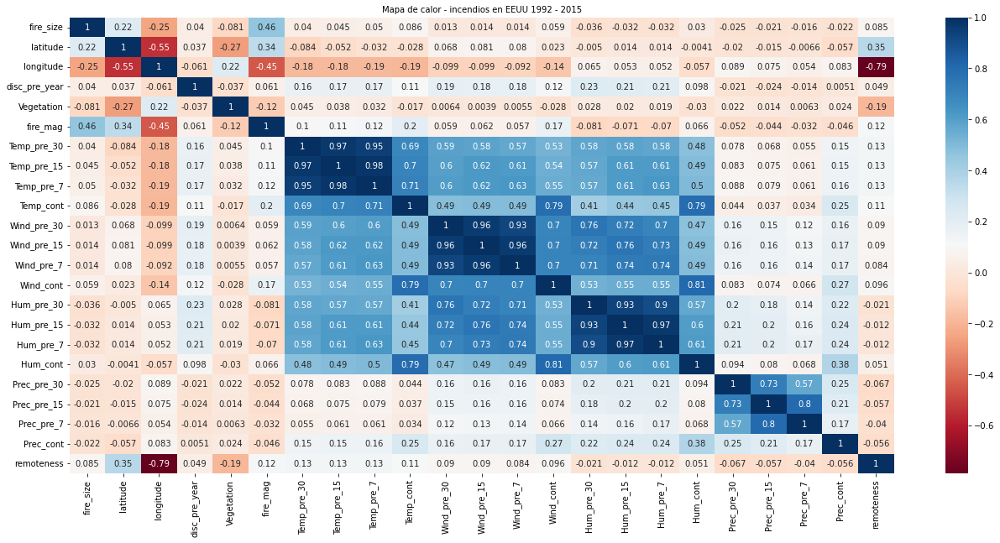

In [204]:
#Hacemos un mapa de calor del df
plt.rcParams['figure.figsize'] = (22, 10)
sns.heatmap(df.corr(), annot = True, cmap = 'RdBu')
plt.title('Mapa de calor - incendios en EEUU 1992 - 2015', fontsize = 10)
plt.show()

La matriz de correlación se utiliza para evaluar la fuerza y dirección de la relación entre dos, o más, elementos o variables. Un valor de correlación alto y positivo indica que los elementos miden la misma destreza o característica. Si los elementos no están altamente correlacionados, entonces los elementos pudieran medir diferentes características o no estar claramente definidos.

A menudo, las variables con valores de correlación mayores que 0.7 se consideran altamente correlacionadas. Sin embargo, el valor de referencia adecuado que se utilizará también depende de las normas en su área de estudio y el número de elementos en el análisis.

Como podemos ver la diagonal principal se representa con 1, ya que la misma está correlacionada con su misma variable. 

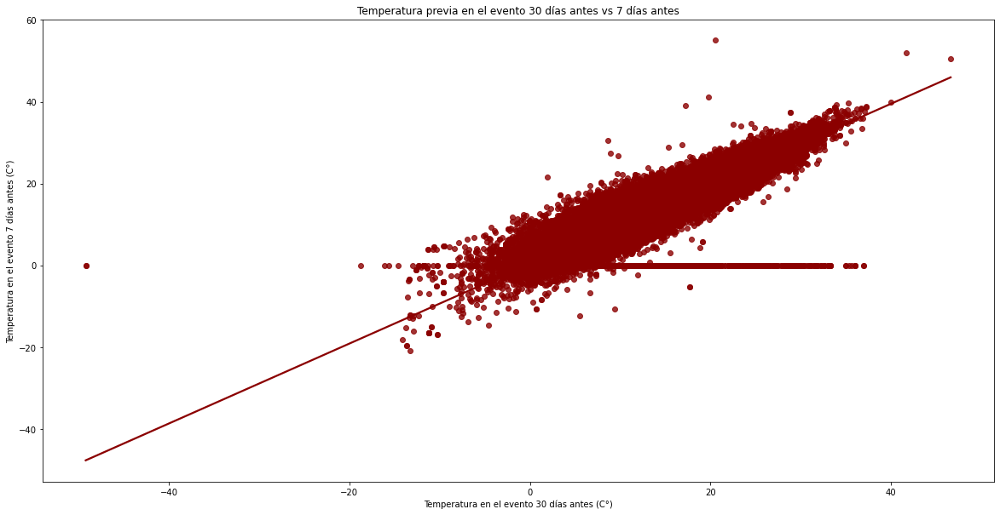

In [205]:
#GRÁFICO TEMPERATURAS PREVIA 30 DÍAS CON TEMPERATURA PREVIA 7 DÍAS
plt.figure(figsize=(20,10))
sns.regplot(x="Temp_pre_30", y="Temp_pre_7", data=df, color="darkred")
plt.xlabel('Temperatura en el evento 30 días antes (C°)')
plt.ylabel('Temperatura en el evento 7 días antes (C°)')
plt.title('Temperatura previa en el evento 30 días antes vs 7 días antes')
plt.show()


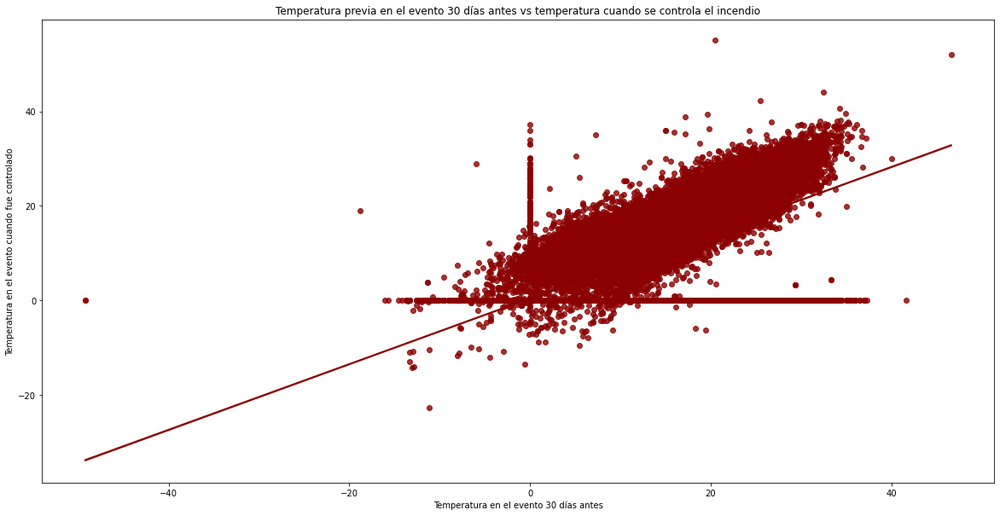

In [206]:
#GRÁFICO TEMPERATURAS PREVIA 30 DÍAS CON TEMPERATURA DEL LUGAR EL DÍA QUE EL FUEGO FUE CONTENIDO
plt.figure(figsize=(20,10))
sns.regplot(x="Temp_pre_30", y="Temp_cont", data=df, color="darkred")
plt.xlabel('Temperatura en el evento 30 días antes')
plt.ylabel('Temperatura en el evento cuando fue controlado')
plt.title('Temperatura previa en el evento 30 días antes vs temperatura cuando se controla el incendio')
plt.show()

Analizando las variables temperaturas 30 y 7 días antes del evento, podemos observar que ambas poseen una correlación positiva y significativa; como así también la temperatura 30 días antes del evento y la temperatura cuando el evento fue contenido.

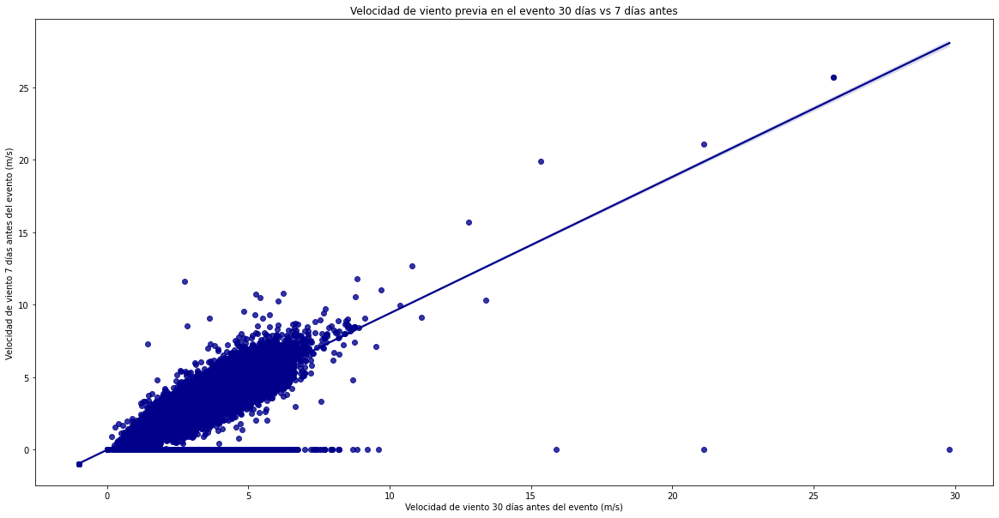

In [207]:
#Gráfico de viento 30 días antes vs 7 días antes del evento
plt.figure(figsize=(20,10))
sns.regplot(x="Wind_pre_30", y="Wind_pre_7", data=df, color="darkblue")
plt.xlabel('Velocidad de viento 30 días antes del evento (m/s)')
plt.ylabel('Velocidad de viento 7 días antes del evento (m/s)')
plt.title('Velocidad de viento previa en el evento 30 días vs 7 días antes')
plt.show()

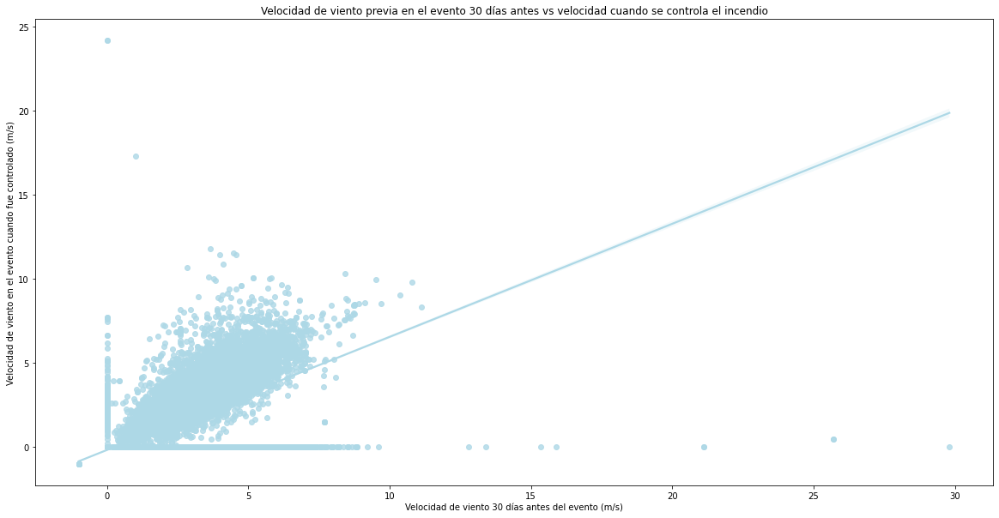

In [208]:
#GRÁFICO VIENTO PREVIO 30 DÍAS CON VIENTO DEL LUGAR EL DÍA QUE EL FUEGO FUE CONTENIDO
plt.figure(figsize=(20,10))
sns.regplot(x="Wind_pre_30", y="Wind_cont", data=df, color="lightblue")
plt.xlabel('Velocidad de viento 30 días antes del evento (m/s)')
plt.ylabel('Velocidad de viento en el evento cuando fue controlado (m/s)')
plt.title('Velocidad de viento previa en el evento 30 días antes vs velocidad cuando se controla el incendio')
plt.show()

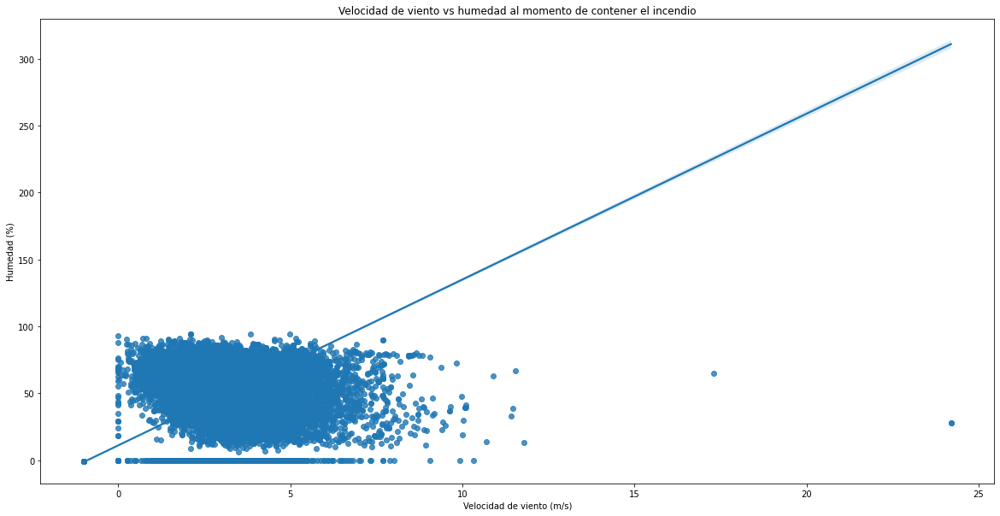

In [209]:
plt.figure(figsize=(20,10))
sns.regplot(x="Wind_cont", y="Hum_cont", data=df)
plt.xlabel('Velocidad de viento (m/s)')
plt.ylabel('Humedad (%)')
plt.title('Velocidad de viento vs humedad al momento de contener el incendio')
plt.show()

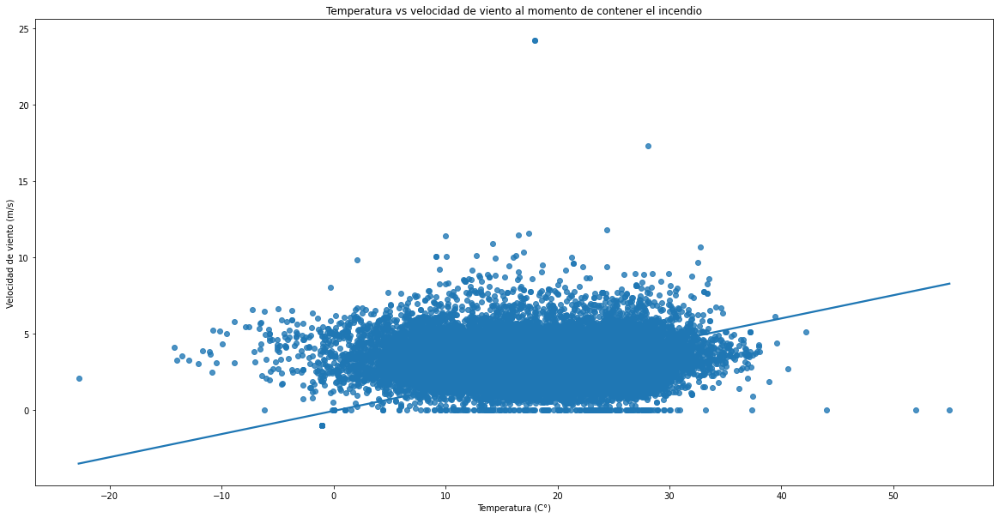

In [210]:
plt.figure(figsize=(20,10))
sns.regplot(x="Temp_cont", y="Wind_cont", data=df)
plt.xlabel('Temperatura (C°)')
plt.ylabel('Velocidad de viento (m/s)')
plt.title('Temperatura vs velocidad de viento al momento de contener el incendio')
plt.show()

Respecto al viento se dan las mismas relaciones que con la temperatura, hay correlacion 30 y 7 días antes del evento, como así también respecto al viento el día que el evento fue contenido. 
Por último vemos un grafico relacionando la humedad y el viento, donde podemos ver que hay una leve correlación entre ambas variables. Mismo caso para temperatura y viento.

<AxesSubplot:xlabel='fire_size_class', ylabel='Prec_pre_7'>

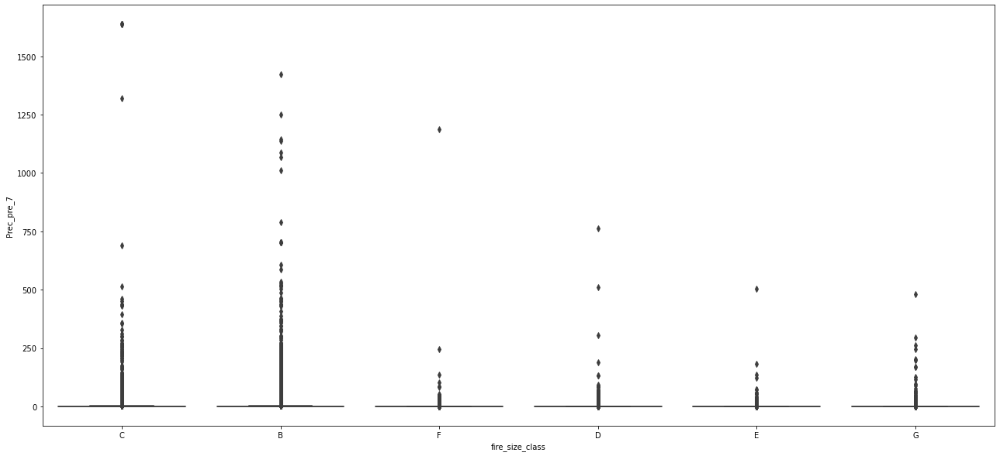

In [211]:
#Gráfico tipo de fuego vs precipitación
sns.boxplot(x=df['fire_size_class'], y=df['Prec_pre_7'])

Se puede observar que los eventos más perjudiciales se dan donde no hay elevadas precipitaciones 7 días antes del evento.

In [212]:
#TIPO DE FUEGO VS TEMPERATURA BOXPLOT CON PX
fig = px.box(df, x='fire_size_class', y='Temp_pre_7',
             title = "Boxplot tipo de fuego vs temperatura")
fig.show()

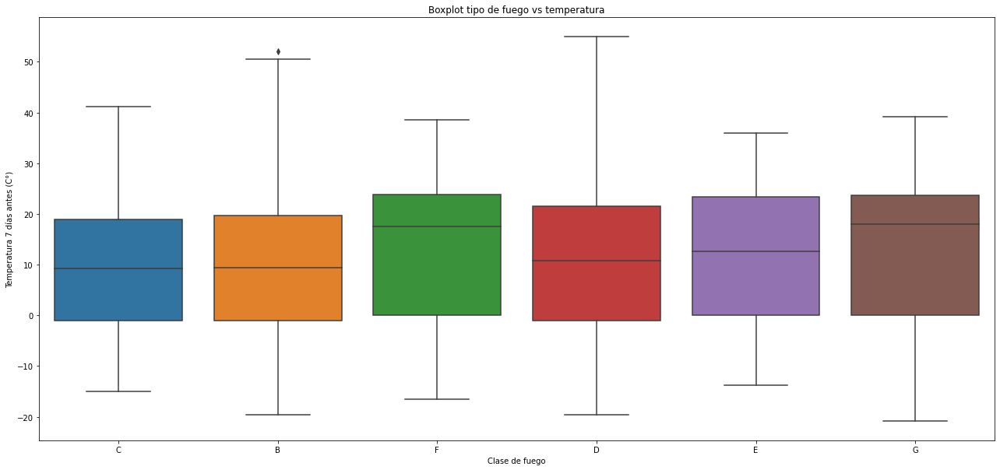

In [213]:
#Boxplot tipo de fuego vs temperatura
sns.boxplot(x=df['fire_size_class'], y=df['Temp_pre_7'])
plt.xlabel("Clase de fuego")
plt.ylabel("Temperatura 7 días antes (C°)")
plt.title("Boxplot tipo de fuego vs temperatura")
plt.show()

El boxplot nos permite identificar cinco medidas descriptivas de forma rápida. Ellas son: primer cuartil, mediana, tercer cuartil, bigotes y rango intercuartil. 

- El primer cuartil representa el 25% de las observaciones; 
- El segundo cuartil o mediana es el 50% de las observaciones; 
- El tercer cuartil representa el 75% de las observaciones; 
- El rango intercuartil (RIC), abarca el tramo de la escala que va desde el primer cuartil (C1) al tercer cuartil (C3), el cual incluye el 50% de las observaciones centrales. 
- Los bigotes son líneas que salen a los costados de la caja y que sirven como referencia para ubicar las observaciones que están por fuera del 50 % central de la distribución. Habrá un límite superior, que no podrá superar el 1,5  veces el RIC, si el máximo no supera ese valor, la longitud del bigote será desde el tercer cuartil hasta el máximo. Habrá un límite inferior, que no podrá superar el 1,5  veces el RIC, si el mínimo no supera ese valor, la longitud del bigote será desde el primer cuartil hasta el mínimo.
- Los outilers, que son los valores atípicos, es decir, aquellos puntos que están más allá del límite inferior o superior (determinados por los bigotes).

Con este gráfico podemos conocer:
- clase B, C y D: la mediana es 10, es decir que el 50% de la temperatura en esta clase es menor a ese valor. También podemos observar que el rango de temperatura se ubica entre los 0 y 20 grados. En la clase B, observanmos un valor atípico de 50 grados. En estas clases podemos decir que, como la mediana se sitúa en el centro de la caja entonces la distribución es simétrica y tanto la media, mediana y moda coinciden.
- clase E:la mediana está por encima de 10 grados, entonces podemos decir que tiene una asimetría positiva o segada a la derecha si la parte más larga de la caja es la parte superior a la mediana, es decir, los datos se concentran en la parte inferior de la distribución. Dado esto, la media suele ser mayor que la mediana. El rango intercuartil está entre 0 y un poco más de 20 grados.
- clase F y G: en esta clase observamos una mediana de aproximadamente 18 grados. Entonces podemos decir que tiene una asimetría positiva o segada a la derecha si la parte más larga de la caja es la parte superior a la mediana, es decir, los datos se concentran en la parte inferior de la distribución. Dado esto, la media suele ser mayor que la mediana. El rango intercuartil está entre 0 y un poco más de 22 grados.

Que un lado de la caja sea más largo que otro, no quiere decir que ese lado contenga más datos. Indica un rango más amplio, por lo que los datos estarán más dispersos. Un rango menos amplio, indica que los datos están más próximos.

In [214]:
#Boxplot tipo de fuego y vegetación donde se produjo el evento
fig = px.box(df, x='fire_size_class', y='Vegetation',
             title = "Boxplot tipo de fuego vs vegetación")
fig.show()

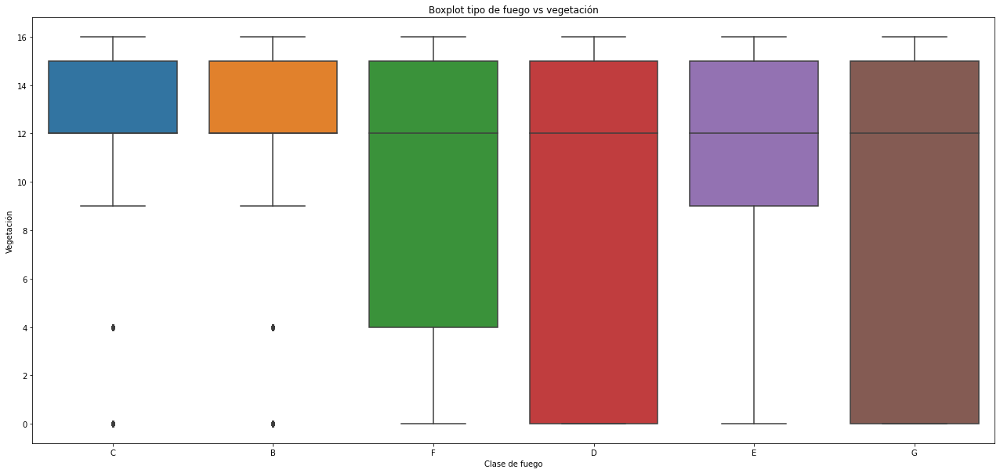

In [215]:
#Boxplot tipo de fuego y vegetación donde se produjo el evento
sns.boxplot(x=df['fire_size_class'], y=df['Vegetation'])
plt.xlabel("Clase de fuego")
plt.ylabel("Vegetación")
plt.title("Boxplot tipo de fuego vs vegetación")
plt.show()

En este boxplot vemos que para todas las categorías la mediana es 12, es decir que para las categorías D, E, F y G, el 50% de los incendios ocurrieron en otro tipo de vegetación; mientras que para la categoría B y C, la mayoría de los eventos ocurrierron en este tipo de vegetación: 13:Tundra, 14:Desierto,15:Desierto polar, 16:Bosque Secundario Tropical Siempre verde Latifoliado.

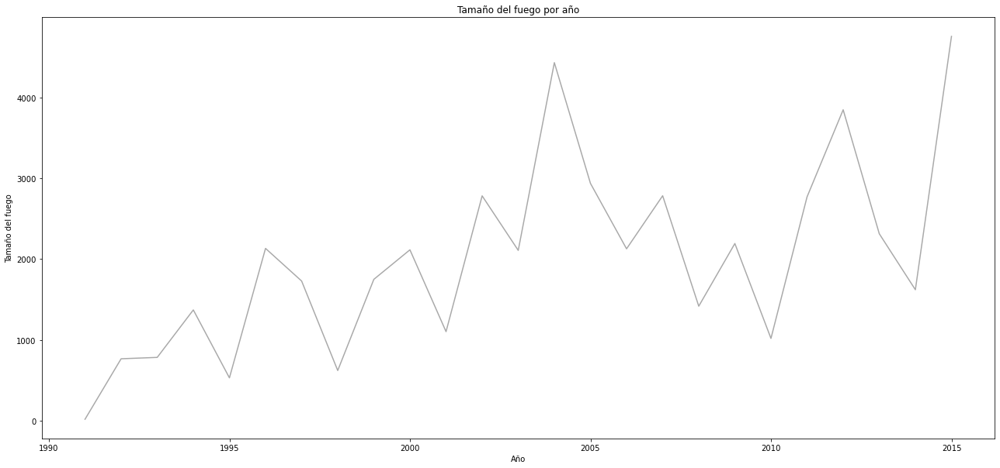

In [216]:
#Agrupación por año vs tamaño del fuego
year_fire = df.groupby('disc_pre_year').mean()["fire_size"]
year_fire.plot.line(color ="darkgrey",xlabel="Año", ylabel="Tamaño del fuego", title="Tamaño del fuego por año")
plt.show()

Se puede ver como hay un pico previo al año 2005 y en la última parte del dataset se supero el maximo histórico.

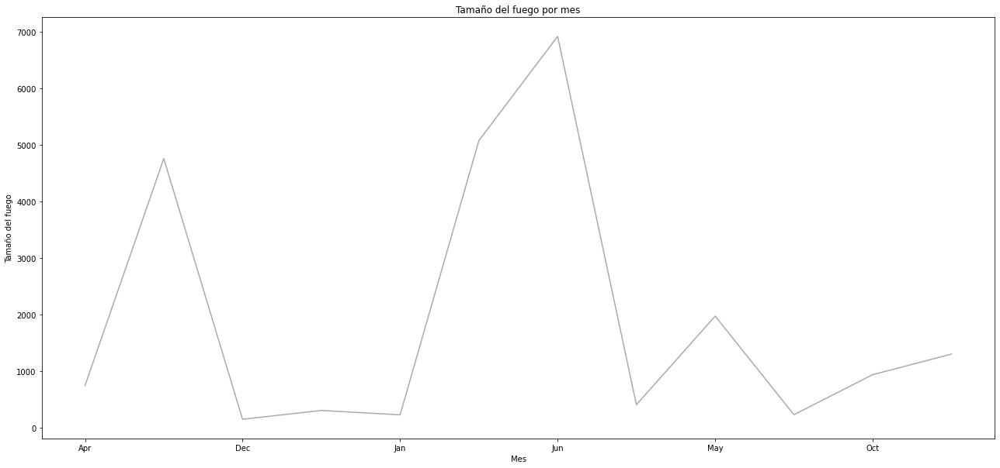

In [217]:
#Agrupación por mes vs tamaño del fuego
mounth_fire = df.groupby('discovery_month').mean()["fire_size"]
mounth_fire.plot.line(color ="darkgrey",xlabel="Mes", ylabel="Tamaño del fuego", title="Tamaño del fuego por mes")
plt.show()

Se puede ver como hay un pico en el mes de junio, donde en el hemisferio norte, corresponde a la temporada de primavera/verano, momento donde ocurren los incendios más grandes, en promedio.

#Análisis multivariado

In [390]:
#Clase de fuego en función de la temperaturas y las precipitaciones 7 días antes del evento
px.scatter(x=df.Temp_pre_7, y=df.Prec_pre_7, color=df.fire_size_class,
           title="Temperatura (x) y lluvias 7 días previos (y) por tipo de fuego según clase de fuego diferenciado por color")


Una hipótesis que nos da este gráfico es que los incendios más daniños (clase G) se dan cuando, en los 7 días previos al evento, hubieron menos de 100 mm de precipitación. También se destaca que la mayoría de los eventos se dieron cuando hubo menos de 200 mm de precipitación 7 días antes. Por el lado de la temperatura la mayoría de los eventos se dieron entre los 0 y los 30 grados Celsius. 

c:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:337: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



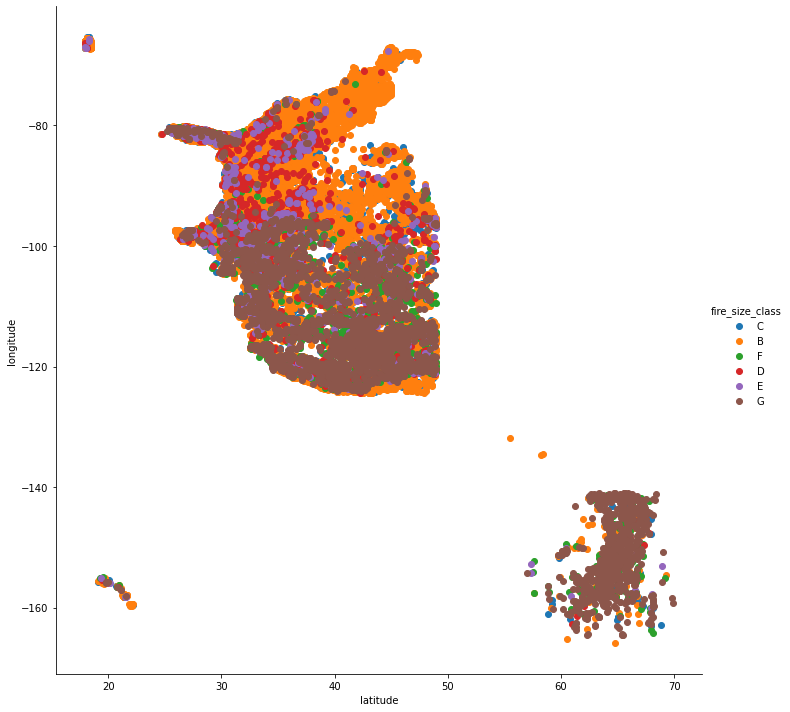

In [219]:
#Relación del tipo de fuego con ubicación geográfica del incendio
sns.FacetGrid(df,hue = 'fire_size_class' , size = 10).map(plt.scatter,'latitude','longitude').add_legend();
plt.show()

No se puede establecer una relación clara entre latitud, longitud y el tipo de fuego. No se observan casos entre 50 - 60 grados de latitud y los 120 - 160 grados de longitud, esto posiblemente se deba a que existen ciudades en esos rangos y por eso no se producen incendios forestales.

c:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:337: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



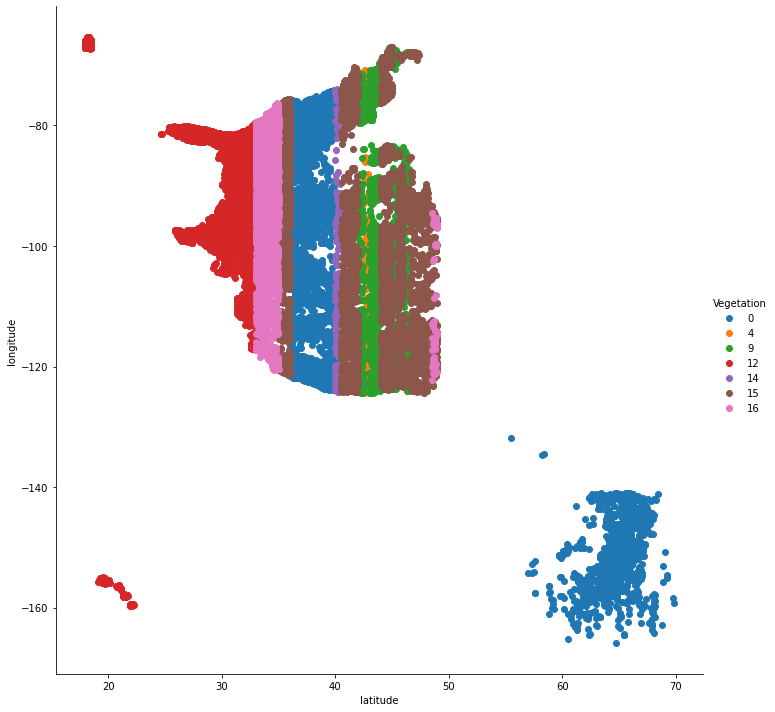

In [220]:
#Diferenciación de Vegetación x latitud y longitud
sns.FacetGrid(df,hue = 'Vegetation' , size = 10).map(plt.scatter,'latitude','longitude').add_legend();
plt.show()

Se ve claramente que la diferencia del tipo de vegetación de los lugares donde ocurrieron incendios está relacionada con la latitud.

c:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:337: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



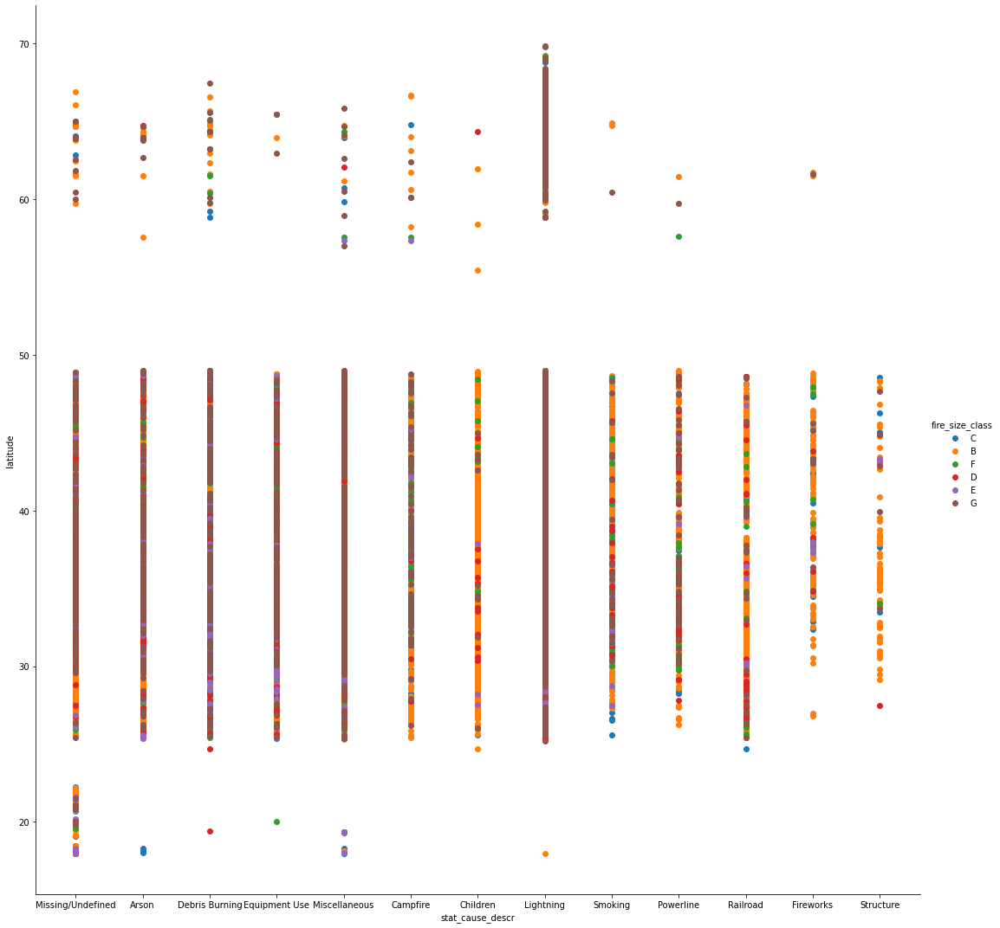

In [221]:
#Relación entre causa, tipo de fuego (daño) y latitud.
sns.FacetGrid(df,hue = 'fire_size_class' , size = 15).map(plt.scatter,'stat_cause_descr','latitude').add_legend();
plt.show()

En este gráfico se puede determinar que si un incendio es causado por una descarga eléctrica debida a un rayo lo más probable es que sea un evento de tipo G, el más dañino, independientemente de la latitud del mismo.

c:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:337: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



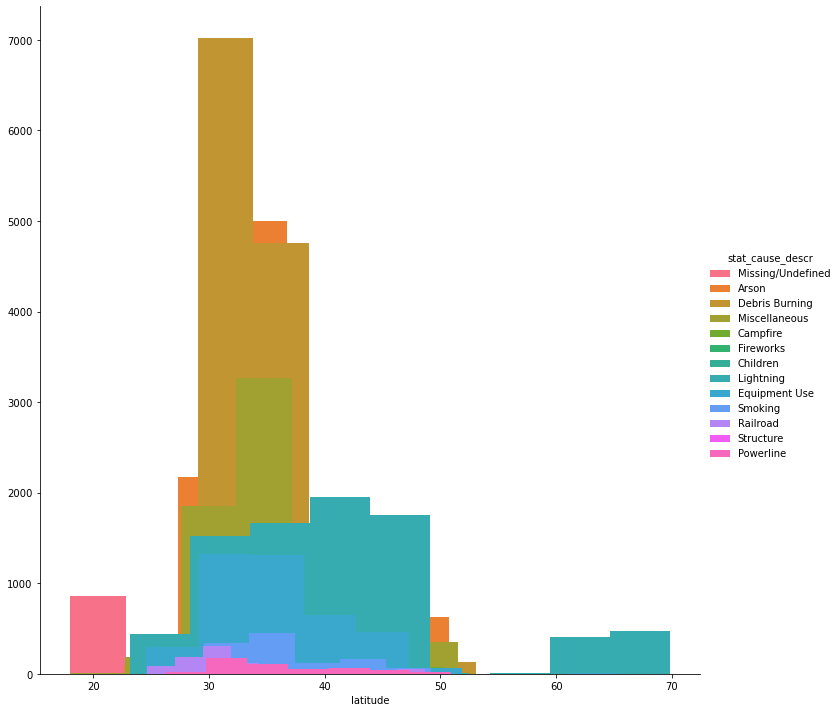

In [222]:
#Histograma de latitud diferenciado por causa.
sns.FacetGrid(df,hue = 'stat_cause_descr', size = 10).map(plt.hist,'latitude').add_legend();
plt.show()

Podemos ver que entre las latitudes 30 y 40 se encuentran la mayor parte de los incendios causados por intencionalidad.

c:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:337: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



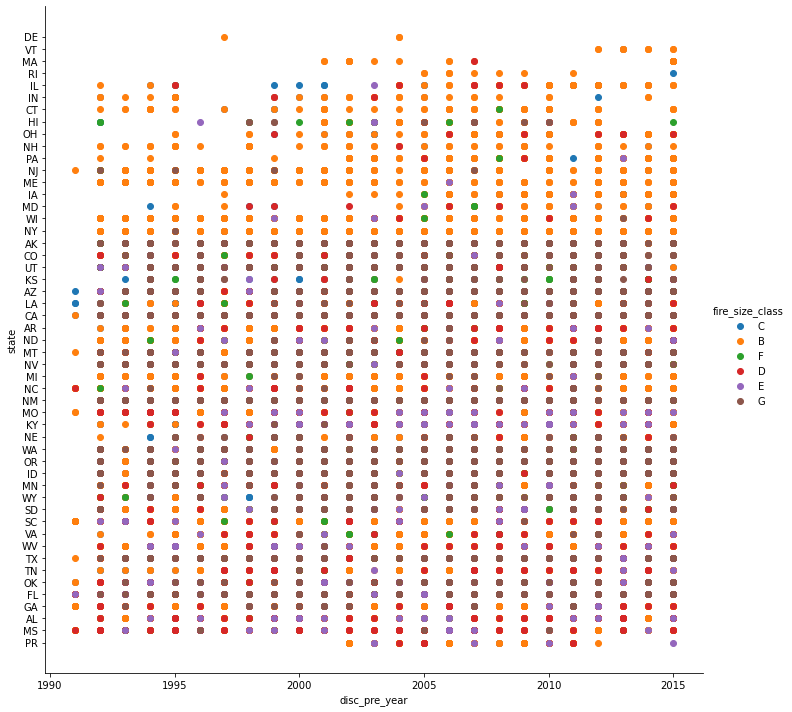

In [223]:
#Año del evento, estado y tipo de fuego
sns.FacetGrid(df,hue = 'fire_size_class' , size = 10).map(plt.scatter,'disc_pre_year','state').add_legend();
plt.show()

A partir de este gráfico se pueden determinar dos patrones: a) hay estados donde los incendios son la mayor parte de las veces de tipo G, independientemente del año que se dio el evento, estos son los estados de AK, CO, UT, CA, NV y MT; b) de la misma forma hay estados que en diferentes años sus incendios son poco daniños, estos son IN, CT, NH, PA, NJ, ME, WI y NY.

Text(0.5, 1.0, 'Tamaño del fuego por estado')

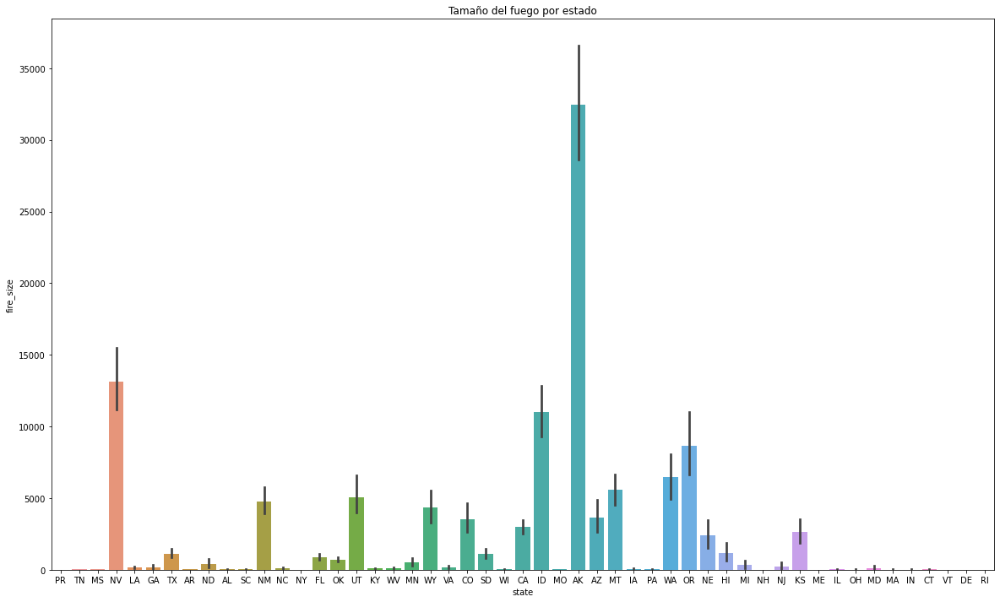

In [224]:
fig = plt.subplots(figsize = (20, 12))
fig = sns.barplot(x="state", y="fire_size", data=df)
plt.title('Tamaño del fuego por estado')

Se puede ver claramente como, en el estado de AK, el tamaño del área afectada por el fuego es mucho mayor que en los otros estados.

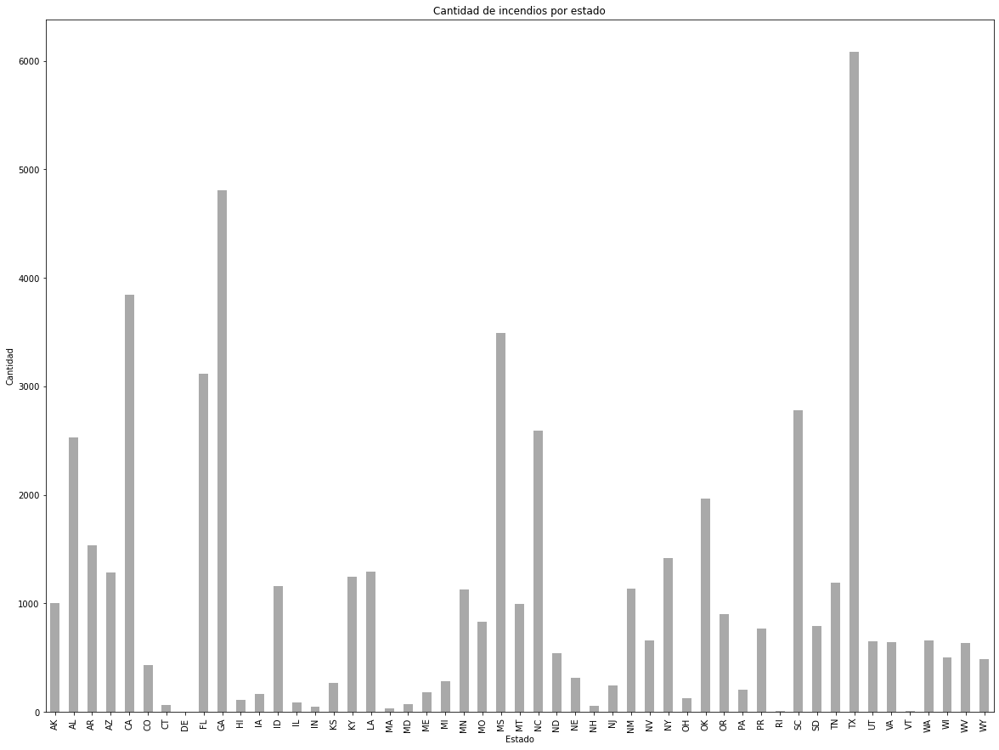

In [225]:
df['state'].value_counts().sort_index().plot.bar(xlabel="Estado",ylabel="Cantidad", color="darkgrey",title="Cantidad de incendios por estado",figsize=(20,15))
plt.show()

Vemos que la mayor cantidad de incendios se dieron en el estado de TX, GA, CA y MS. Sin embargo en el gráfico del tamaño del fuego en estos lugares suelen ocurrir incendios de baja magnitud.
Caso diferente ocurre con los estados AK y NV, en estos lugares hay pocos incendios y de gran magnitud.

In [226]:
px.pie(df, values="fire_size",names="stat_cause_descr",
       title="Tamaño del fuego relacionado y causas")


Previamente vemos realizado el recuento y la frecuencia de ocurrencia de incendios según las diversas causas probables de justificación del evento. Con este gráfico podemos comprender esos cálculos, con este gráfico de torta podemos llegar a la conclusión, que si bien los rayos no son los mayores causantes de incendios, estos producen los incendios que más superficie dañan.

In [227]:
fig = px.scatter_3d(df, x="Temp_pre_7", y="Wind_pre_7", z='Prec_pre_7', title="Gráfico tridimensional de temperatura, viento y precipitación 7 días antes del evento")
fig.show()

Al analizar el gráfico tridimensional podemos decir que la mayoría de los eventos se dan a velocidades de viento menores a 10 m/s, temperaturas entre los 10 y los 30 grados centigrados y precipitaciones menores a 400 mm, con mayoría de datos en los 200 mm.

In [228]:
fig = px.scatter_3d(df, x="Temp_cont", y="Wind_cont", z='Prec_cont', title="Gráfico tridimensional de temperatura, viento y precipitación cuando el incendio es controlado")
fig.show()


En este caso el gráfico nos muestra que la variable más determinante al momento de controlar un incendio es la precipitación, vemos que tanto la temperatura como la velocidad del viento se mueven en valores similares que el gráfico a 7 días; mientras que las lluvias están en el orden de los 400 mm.

In [229]:
fig = px.scatter_3d(df, x="fire_size_class", y="Temp_pre_7", z='Temp_pre_30')
fig.show()

In [230]:
fig = px.scatter_3d(df, x="fire_size_class", y="Wind_pre_7", z='Wind_pre_30')
fig.show()

In [231]:
fig = px.scatter_3d(df, x="fire_size_class", y="Prec_pre_7", z='Prec_pre_30', title="Gráfico tridimensional de precipitaciones 30 y 7 días antes del evento y el tipo de fuego")
fig.show()

No es sorpresa los datos que revela este gráfico tridimensional, todos los eventos se concentran en su mayoría cerca del origen (0,0) del plano formado por las variables Prec_pre_30 y Prec_pre_7. Lo que significa que existieron pocas precipitaciones al momento de los incendios.

In [232]:
fig = px.scatter_3d(df, x="Prec_pre_7", y="Temp_pre_7", z='fire_size_class',title="Gráfico tridimensional de temperatura y viento 7 días antes del evento y el tipo de fuego")
fig.show()

En el siguiente gráfico podemos ver la relación entre las variables. 
Estos gráficos tienen 2 ejes predictores (eje x y eje y). En este caso las precipitaciones y las temperaturas 7 días antes del evento pueden predecir el tamaño que alcanzará el incendio, es decir que el tamaño del evento depende de las condiciones climáticas que haya en el lugar del evento.
En análisis, el gráfico muestra que el tamaño del incendio se puede predecir teniendo en cuenta las precipicio y la temperatura 7 días previos, teniendo uns pequeña cantidad de valores atípicos.

# Visualización de datos

##Treemap

In [233]:
incendios_x_vegatacion_x_año = df.groupby('Vegetation')['disc_pre_year'].value_counts().to_frame().rename(columns={'disc_pre_year':'num_incendios'}).reset_index().sort_values('disc_pre_year')
incendios_x_vegatacion_x_año

,Vegetation,disc_pre_year,num_incendios
172,16,1991,30
97,12,1991,61
122,14,1991,1
24,0,1991,6
147,15,1991,8
...,...,...,...
109,14,2015,28
171,16,2015,268
1,0,2015,543
131,15,2015,456


In [234]:
incendios_x_anio_x_clase = df.groupby('fire_size_class')['disc_pre_year'].value_counts().to_frame().rename(columns={'disc_pre_year':'num_incendios'}).reset_index().sort_values('disc_pre_year')
incendios_x_anio_x_clase

,fire_size_class,disc_pre_year,num_incendios
49,C,1991,22
74,D,1991,4
99,E,1991,1
24,B,1991,79
97,E,1992,14
...,...,...,...
47,C,2015,326
109,F,2015,98
65,D,2015,47
86,E,2015,27


In [235]:
fig = px.treemap(df, path=['fire_size_class', 'Vegetation'])
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

c:\ProgramData\Anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



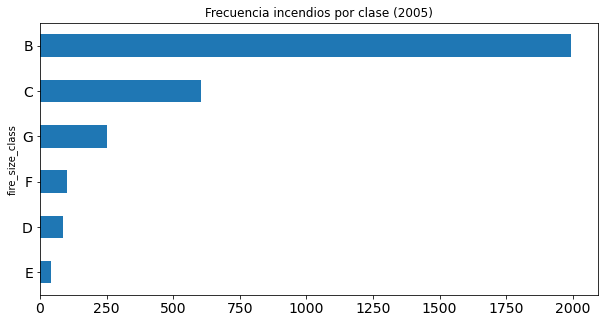

In [236]:
#@title Histograma de Incendios por clase { display-mode: "form", run: "auto" }
#@markdown Cantidad de incendios ocurrido spor año

year = 2005 #@param {type:"slider", min:1991, max:2015, step:1}

year_filter = incendios_x_anio_x_clase['disc_pre_year'] == year

(incendios_x_anio_x_clase[year_filter]
 .groupby('fire_size_class')['num_incendios']
 .sum()
 .to_frame()
 .reset_index().sort_values('num_incendios')
 .plot
 .barh(
      x='fire_size_class', y='num_incendios',legend=False,
      title=f"Frecuencia incendios por clase ({year})", 
      figsize=(10,5),
      fontsize=14));

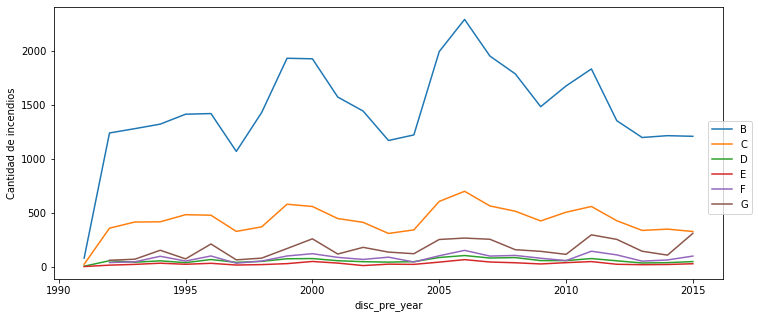

In [237]:
ax = incendios_x_anio_x_clase.pivot(index='disc_pre_year', columns='fire_size_class', values='num_incendios').plot(figsize=(12,5),ylabel='Cantidad de incendios')
ax.legend(bbox_to_anchor = (1.05, 0.6))

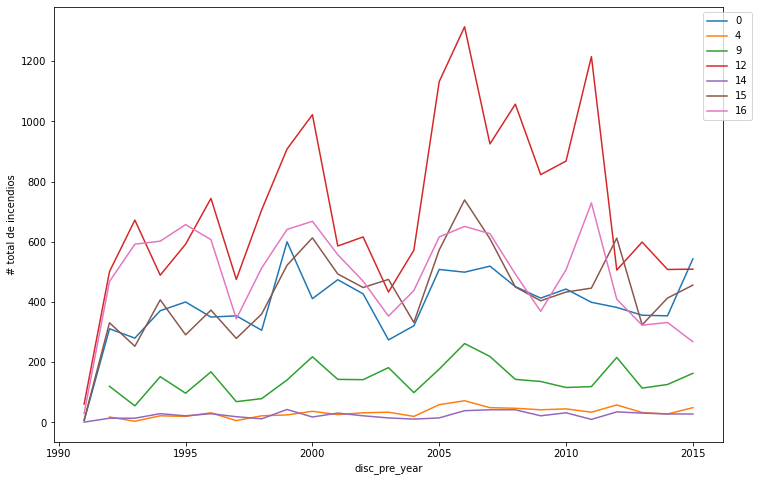

In [238]:
ax = incendios_x_vegatacion_x_año.pivot(index='disc_pre_year', columns='Vegetation', values='num_incendios').plot(figsize=(12,8),ylabel='# total de incendios')
ax.legend(bbox_to_anchor = (1.05, 1))

#Algoritmos de clasificación

##Librerías

In [239]:
#Importamos librerías
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn import tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn import utils
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import plotly.express as px
import urllib.request
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
import pandas as pd
from sklearn import metrics
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

##Arbol de decisión

In [240]:
#Cargamos el data set, eliminamos columnas no utilizadas para los análisis predictivos y renombramos columnas de strings a int
df_pred=df.drop(["fire_name","state","discovery_month","putout_time","fire_size","fire_mag","Temp_pre_30","Temp_pre_15","Temp_cont","Wind_pre_30","Wind_pre_15","Wind_cont","Hum_pre_30","Hum_pre_15","Hum_cont","Prec_pre_30","Prec_pre_15","Prec_cont"], axis=1)
df_pred["fire_size_class"].replace({"B": 1, "C": 2,"D": 3, "E": 4,"F": 5, "G": 6}, inplace=True)
df_pred["stat_cause_descr"].replace({"Debris Burning": 1, "Arson": 2,"Miscellaneous": 3, "Lightning": 4,"Missing/Undefined": 5, "Equipment Use": 6,"Campfire":7,"Children":8,"Smoking":9,"Railroad":10,"Powerline":11,"Fireworks":12,"Structure":13}, inplace=True)
df_pred.head()

,fire_size_class,stat_cause_descr,latitude,longitude,disc_pre_year,Vegetation,Temp_pre_7,Wind_pre_7,Hum_pre_7,Prec_pre_7,remoteness
0,2,5,18.105072,-66.753044,2007,12,24.902597,3.262092,76.381579,0.0,0.017923
1,1,2,35.038330,-87.610000,2006,15,0.343529,1.976471,55.505882,0.0,0.184355
2,2,2,34.947800,-88.722500,2004,16,5.558750,2.695833,76.812834,18.1,0.194544
3,1,1,39.641400,-119.308300,2005,0,18.142564,3.671282,35.353846,0.0,0.487447
4,1,3,30.700600,-90.591400,1999,12,-1.000000,-1.000000,-1.000000,-1.0,0.214633


In [241]:
df_pred.dtypes

fire_size_class       int64
stat_cause_descr      int64
latitude            float64
longitude           float64
disc_pre_year         int64
Vegetation            int64
Temp_pre_7          float64
Wind_pre_7          float64
Hum_pre_7           float64
Prec_pre_7          float64
remoteness          float64
dtype: object

In [242]:
#x para el arbol
X_arbol=df_pred.drop(columns=["fire_size_class"])
X_arbol.head(1)

,stat_cause_descr,latitude,longitude,disc_pre_year,Vegetation,Temp_pre_7,Wind_pre_7,Hum_pre_7,Prec_pre_7,remoteness
0,5,18.105072,-66.753044,2007,12,24.902597,3.262092,76.381579,0.0,0.017923


In [243]:
#y para el arbol => target
y_arbol=df_pred["fire_size_class"]
y_arbol.head()

0    2
1    1
2    2
3    1
4    1
Name: fire_size_class, dtype: int64

In [244]:
#Separamos el 30% para test y el 70% para el entrenamiento
X_train_arbol, X_test_arbol, y_train_arbol, y_test_arbol = train_test_split(X_arbol, y_arbol, test_size=0.30, random_state=42)

In [245]:
#Creación árbol
arbol = DecisionTreeClassifier(max_depth=5, random_state = 42, min_samples_split=10)

In [246]:
#Entrenar el modelo
arbol.fit(X_train_arbol,y_train_arbol)

DecisionTreeClassifier(max_depth=5, min_samples_split=10, random_state=42)

In [247]:
#Predicción en Train
y_train_pred_arbol = arbol.predict(X_train_arbol) 
#Predicción en Test
y_test_pred_arbol = arbol.predict(X_test_arbol) 

In [248]:
#Calculamos el accuracy en Train
train_accuracy_arbol = accuracy_score(y_train_arbol, y_train_pred_arbol)

#Calculamos el accuracy en Test
test_accuracy_arbol = accuracy_score(y_test_arbol, y_test_pred_arbol)

print('% de aciertos sobre el set de entrenamiento:', train_accuracy_arbol)
print('% de aciertos sobre el set de evaluación:',test_accuracy_arbol)

% de aciertos sobre el set de entrenamiento: 0.7265971720507792
% de aciertos sobre el set de evaluación: 0.7245800975257359


In [249]:
#Importancia de cada variable
arbol.feature_importances_

array([2.93094522e-02, 1.23542940e-01, 2.62149896e-01, 2.18727058e-03,
       6.11733180e-03, 1.01098890e-03, 4.40411109e-04, 0.00000000e+00,
       3.49193694e-03, 5.71749772e-01])

c:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



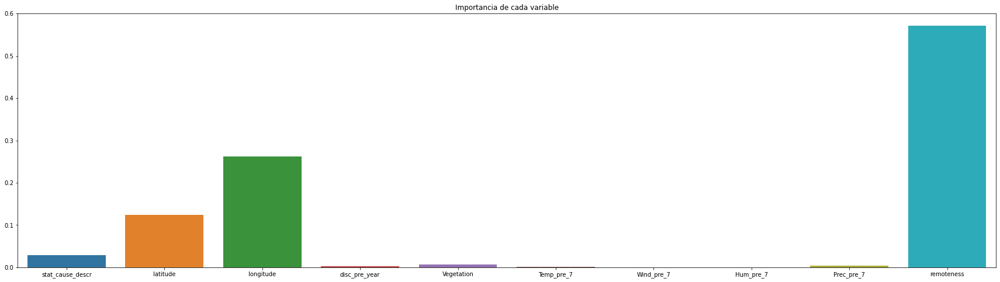

In [250]:
plt.figure(figsize=(30,8))
importances = arbol.feature_importances_
columns = X_arbol.columns
sns.barplot(columns, importances)
plt.title('Importancia de cada variable')
plt.show()

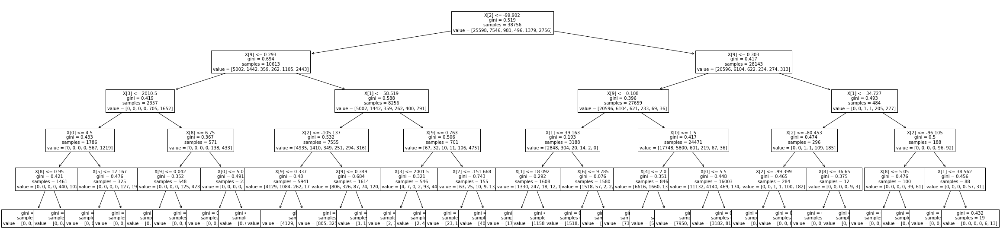

In [251]:
plt.figure(figsize=(40,10))
tree.plot_tree(arbol, fontsize=10)
plt.show()

Para este complementario de árboles de decisión se tuvo en cuenta el siguiente punto
- El dataset al tener muchas variables tipo object se las decidió tratar de dos maneras diferentes.
Por un lado se eliminaron algunas columnas al momento de leer el dataframe desde el .csv y; por otro lado, se utilizó la función get_dummies para que la variable objetivo (que también es tipo object) pueda desempeñarse correctamente en el modelo. En este caso solo se dejó el fire_class_size = G que es el tipo de fuego que más superficie de incidencia ocupan sus llamas.
Cabe aclarar que no es la idea del proyecto final porque solamente estamos haciendo un árbol solamente para uno de los tipos de fuego (en este caso el tipo G, más dañino) y no estamos incluyendo a los demás tipos de fuego, ni tampoco una variable de suma importancia como la causa del incendio.
- Esta primera aproximación fue útil para el correcto entendimiento de un árbol de decisión y de algunas de las funciones de libraría Scikit Learn.
En este árbol podemos ver que las variables que más incidencia tienen en el árbol explicado son las que tienen que ver con la ubicación del evento, *longitud*, *latidud* y *remoteness*; recordar que está última es la distancia desde el punto inicial del incendio a la ciudad más cercana.

In [252]:
# Accuracy
print(f"Accuracy of the classifier is: {accuracy_score(y_test_arbol, y_test_pred_arbol)}")

Accuracy of the classifier is: 0.7245800975257359


In [253]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_arbol, y_test_pred_arbol))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_arbol, y_test_pred_arbol))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_arbol, y_test_pred_arbol)))

Mean Absolute Error: 0.37631689844079225
Mean Squared Error: 0.7323460357594365
Root Mean Squared Error: 0.8557721868344615


[[10907     1     0     0     1    15]
 [ 3256     0     0     0     0     9]
 [  412     0     0     0     0     1]
 [  203     0     0     0     0     1]
 [  127     0     0     0    28   434]
 [   96     0     0     0    19  1101]]


C:\Users\Mauro\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



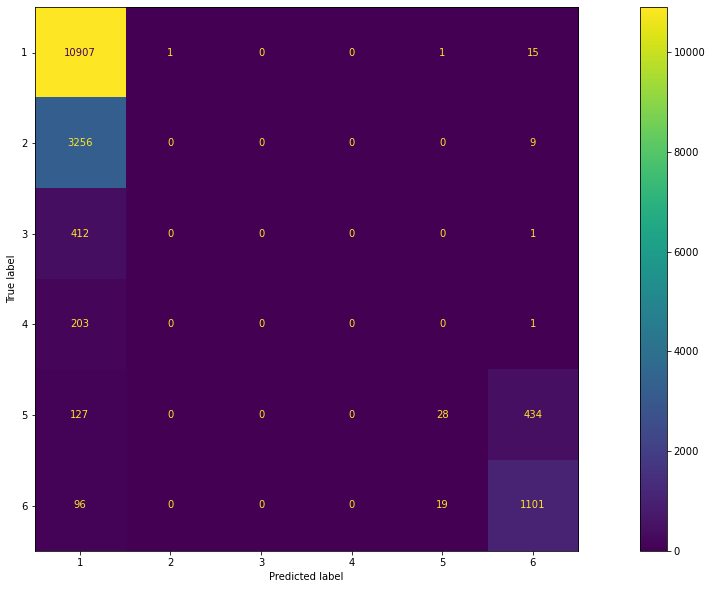

In [254]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

#Matriz de Confusión
print(confusion_matrix(y_test_arbol, y_test_pred_arbol))

#Ploteamos la Matriz
plot_confusion_matrix(arbol, X_test_arbol, y_test_arbol)
plt.show()

###Optimización de hiperparametros arbol de decisión

In [255]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor 

random_forest = RandomForestRegressor() #Instanciamos el modelo

In [256]:
#Definimos los parámetros de búsqueda
params = {
    'n_estimators' : [100, 200, 500],
    'max_features': [2,3]
}

grid_random_forest = GridSearchCV(estimator = random_forest,
                                  param_grid = params,
                                  scoring = 'neg_mean_absolute_error',  # 
                                  cv = 4, 
                                  verbose = 3, #Muestra el resultado en pantalla
                                  n_jobs = 2) # corrida en paralelo

In [257]:
#Entrenamos el modelo
grid_random_forest.fit(X_train_arbol, y_train_arbol)

Fitting 4 folds for each of 6 candidates, totalling 24 fits


GridSearchCV(cv=4, estimator=RandomForestRegressor(), n_jobs=2,
             param_grid={'max_features': [2, 3],
                         'n_estimators': [100, 200, 500]},
             scoring='neg_mean_absolute_error', verbose=3)

In [258]:
grid_random_forest.cv_results_

{'mean_fit_time': array([ 4.50460792,  8.98855817, 21.22956491,  5.94897562, 11.89405006,
        30.23418027]),
 'std_fit_time': array([0.28001144, 0.4078658 , 0.34505215, 0.21995945, 0.25008043,
        0.94048714]),
 'mean_score_time': array([0.23046058, 0.46092004, 1.156205  , 0.21874028, 0.42576402,
        1.0819881 ]),
 'std_score_time': array([0.00676606, 0.01746856, 0.03314748, 0.01104686, 0.00676655,
        0.04862853]),
 'param_max_features': masked_array(data=[2, 2, 2, 3, 3, 3],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_n_estimators': masked_array(data=[100, 200, 500, 100, 200, 500],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'max_features': 2, 'n_estimators': 100},
  {'max_features': 2, 'n_estimators': 200},
  {'max_features': 2, 'n_estimators': 500},
  {'max_features': 3, 'n_estimators': 100},
  {'max_featur

In [259]:
grid_random_forest.best_estimator_

RandomForestRegressor(max_features=3, n_estimators=200)

In [260]:
grid_random_forest.predict(X_train_arbol)
grid_random_forest.predict(X_test_arbol)

array([1.58      , 1.005     , 1.31666667, ..., 1.205     , 1.745     ,
       1.185     ])

##KNN

Tomando la información recabada en el árbol de decisión previo, se tomaran las variables remoteness y precipitación para realizar el modelo KNN

In [261]:
#Creamos un punto nuevo
punto_nuevo = {'remoteness': [0.3],
               'Prec_pre_7': [350]}

In [262]:
#Creación del dataframe con el nuevo punto
punto_nuevo = pd.DataFrame(punto_nuevo)
punto_nuevo

,remoteness,Prec_pre_7
0,0.3,350


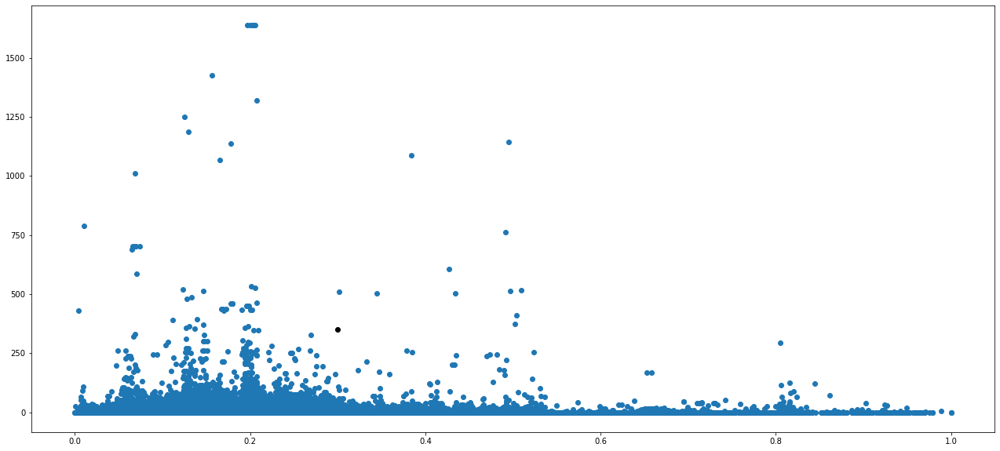

In [263]:
#Graficamos las variables que tenemos en el data set original (azul) y el nuevo punto (negro)
ax=plt.axes()
ax.scatter(df_pred['remoteness'],df_pred['Prec_pre_7'])
ax.scatter(punto_nuevo['remoteness'],punto_nuevo['Prec_pre_7'],c="black")


In [264]:
#Gráfico de remoteness, precipitación y tipo de fuego
px.scatter(x=df_pred.remoteness, y=df_pred.Prec_pre_7, color=df_pred.fire_size_class,
           title="Remoteness en funcion de las precipitaciones 7 dias antes del incendio, diferenciado por tipo de fuego")


In [265]:
#Creación de modelo y entrenamiento
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=100)
X_knn = df_pred[['remoteness', 'Prec_pre_7']]
y_knn = df_pred[['fire_size_class']]

knn.fit(X_knn, y_knn)

C:\Users\Mauro\AppData\Roaming\Python\Python39\site-packages\sklearn\neighbors\_classification.py:200: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



KNeighborsClassifier(n_neighbors=100)

In [266]:
#Predicción del nuevo evento
prediccion = knn.predict(punto_nuevo)
print ("El nuevo evento será de tipo",prediccion)

El nuevo evento será de tipo [1]


Conclusión: El punto nuevo con los datos 0,3 de remoteness y 350 mm de precipitación 7 días antes del potencial evento será con este método un fuego de clase B, correspondiente al tipo 1 del dataframe utilizado para las predicciones.

##Random Forest

En el random forest se pretende estimar el tipo de fuego con el dataset seleccionado. Esto nos va a ayudar a predecir que incendios van a ser más daniños.
Primero se realizará un árbol primario como se realizó en clase, y en una segunda etapa vamos a ver las diferencias con un bosque aleatorio.

In [267]:
#Separamos en X e y
X_forest = df_pred.drop(["fire_size_class"], axis=1)
y_forest = df_pred["fire_size_class"]

In [268]:
#Separamos en train y test!
(X_train_forest, X_test_forest,
y_train_forest, y_test_forest) = train_test_split(X_forest,
                                    y_forest,
                                    stratify=y_forest,
                                    test_size=0.30,
                                    random_state=100)

In [269]:
#Creamos un árbol de decisión y lo fiteamos
tree = DecisionTreeClassifier(random_state=100)
tree.fit(X_train_forest, y_train_forest)

DecisionTreeClassifier(random_state=100)

In [270]:
y_test_pred_forest = tree.predict(X_test_forest) #Predicción en Test

In [271]:
from sklearn.metrics import accuracy_score

#Calculamos el accuracy en Test
test_accuracy_forest = accuracy_score(y_test_forest, y_test_pred_forest)

print('ARBOL => % de aciertos sobre el set de evaluación:',test_accuracy_forest)

ARBOL => % de aciertos sobre el set de evaluación: 0.6188670158328818


In [272]:
#Creamos un random forest!
model = RandomForestClassifier(random_state=100, n_estimators=200,
                               class_weight="balanced", max_features="log2")
model.fit(X_train_forest, y_train_forest)

RandomForestClassifier(class_weight='balanced', max_features='log2',
                       n_estimators=200, random_state=100)

In [273]:
y_test_pred_forest = model.predict(X_test_forest) #Prediccion en Test

In [274]:
#Calculamos el accuracy en Test
test_accuracy = accuracy_score(y_test_forest, y_test_pred_forest)

print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de evaluación: 0.7136837035699235


Conclusión: En una primera instancia vemos que el % de aciertos en un árbol común ronda el 61%; por otro lado, haciendo un bosque aleatorio los aciertos, en este caso aumentan al 71%.

In [275]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_forest, y_test_pred_forest))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_forest, y_test_pred_forest))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_forest, y_test_pred_forest)))

Mean Absolute Error: 0.37216302450183614
Mean Squared Error: 0.6582385166455963
Root Mean Squared Error: 0.8113189980800377


In [276]:
from sklearn.metrics import precision_score
test_prec = precision_score(y_test_forest, y_test_pred_forest,average='micro')
# Precisión!
print(f"Precision Score of the classifier is:", test_prec)

Precision Score of the classifier is: 0.7136837035699235


In [277]:
from sklearn.metrics import recall_score

# Recall
print(f"Recall Score of the classifier is: {recall_score(y_test_forest, y_test_pred_forest,average='micro')}")

Recall Score of the classifier is: 0.7136837035699235


In [278]:
from sklearn.metrics import f1_score

# Calculamos el F1 score
print(f"F1 Score of the classifier is: {f1_score(y_test_forest, y_test_pred_forest,average='micro')}")

F1 Score of the classifier is: 0.7136837035699234


### Optimización hiperparámetros RANDOM FOREST

In [279]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor 

random_forest = RandomForestRegressor() #Instanciamos el modelo

In [280]:
#Definimos los parámetros de búsqueda
params = {
    'n_estimators' : [100, 200, 500],
    'max_features': [2,3]
}

grid_random_forest = GridSearchCV(estimator = random_forest,
                                  param_grid = params,
                                  scoring = 'neg_mean_absolute_error',  # 
                                  cv = 4, 
                                  verbose = 3, #Muestra el resultado en pantalla
                                  n_jobs = 2) # corrida en paralelo

In [281]:
#Entrenamos el modelo
grid_random_forest.fit(X_train_forest, y_train_forest)

Fitting 4 folds for each of 6 candidates, totalling 24 fits


GridSearchCV(cv=4, estimator=RandomForestRegressor(), n_jobs=2,
             param_grid={'max_features': [2, 3],
                         'n_estimators': [100, 200, 500]},
             scoring='neg_mean_absolute_error', verbose=3)

In [282]:
grid_random_forest.cv_results_

{'mean_fit_time': array([ 4.81510079,  8.9934715 , 23.27503937,  6.14156097, 12.00238341,
        32.08026952]),
 'std_fit_time': array([0.60770637, 0.42391199, 0.505585  , 0.17720292, 0.19885592,
        1.63237848]),
 'mean_score_time': array([0.25274438, 0.44848788, 1.17371583, 0.22224391, 0.43123764,
        1.13171583]),
 'std_score_time': array([0.01685939, 0.00701776, 0.04194093, 0.00491764, 0.00920071,
        0.01729744]),
 'param_max_features': masked_array(data=[2, 2, 2, 3, 3, 3],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_n_estimators': masked_array(data=[100, 200, 500, 100, 200, 500],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'max_features': 2, 'n_estimators': 100},
  {'max_features': 2, 'n_estimators': 200},
  {'max_features': 2, 'n_estimators': 500},
  {'max_features': 3, 'n_estimators': 100},
  {'max_featur

In [283]:
grid_random_forest.best_estimator_

RandomForestRegressor(max_features=3, n_estimators=200)

In [284]:
grid_random_forest.predict(X_train_forest)
grid_random_forest.predict(X_test_forest)

array([1.09 , 1.125, 1.48 , ..., 1.33 , 1.215, 1.15 ])

In [285]:
#Recalculamos con los valores obtenidos
model_op = RandomForestClassifier(random_state=100, n_estimators=200,
                               class_weight="balanced", max_features=3)
model_op.fit(X_train_forest, y_train_forest)

RandomForestClassifier(class_weight='balanced', max_features=3,
                       n_estimators=200, random_state=100)

In [286]:
y_test_pred_forest_op = model.predict(X_test_forest) #Predicción en Test

In [287]:
#Calculamos el accuracy en Test
test_accuracy_op = accuracy_score(y_test_forest, y_test_pred_forest_op)

print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de evaluación: 0.7136837035699235


In [288]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_forest, y_test_pred_forest_op))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_forest, y_test_pred_forest_op))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_forest, y_test_pred_forest_op)))

Mean Absolute Error: 0.37216302450183614
Mean Squared Error: 0.6582385166455963
Root Mean Squared Error: 0.8113189980800377


Luego de la optimización no se mejoraron los resultados.

## Clustering Mapeado

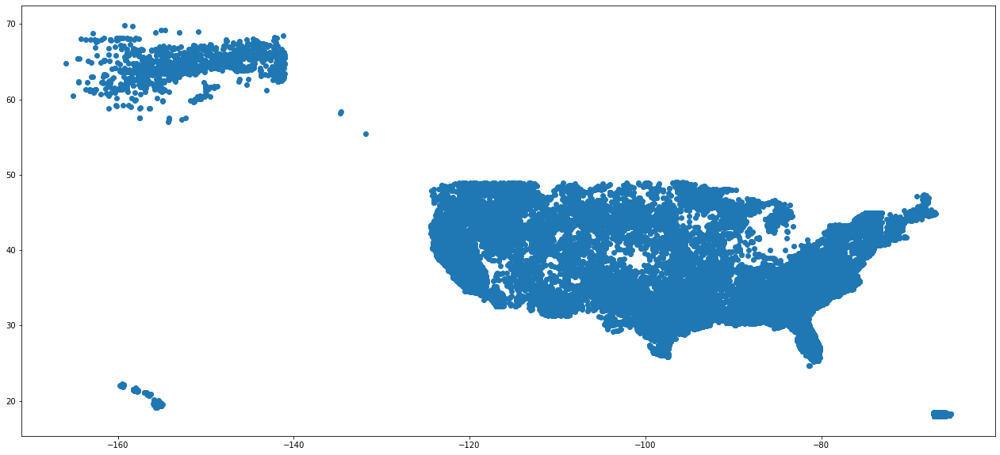

In [289]:
plt.scatter(df_pred['longitude'],df['latitude'])
plt.show()

In [290]:
X_clusmap = df_pred[['latitude','longitude']].values

In [291]:
nearest_neighbors = NearestNeighbors(n_neighbors=50)
nearest_neighbors.fit(X_clusmap)
distances, indices = nearest_neighbors.kneighbors(X_clusmap)
distances = np.sort(distances, axis=0)[:, 1]

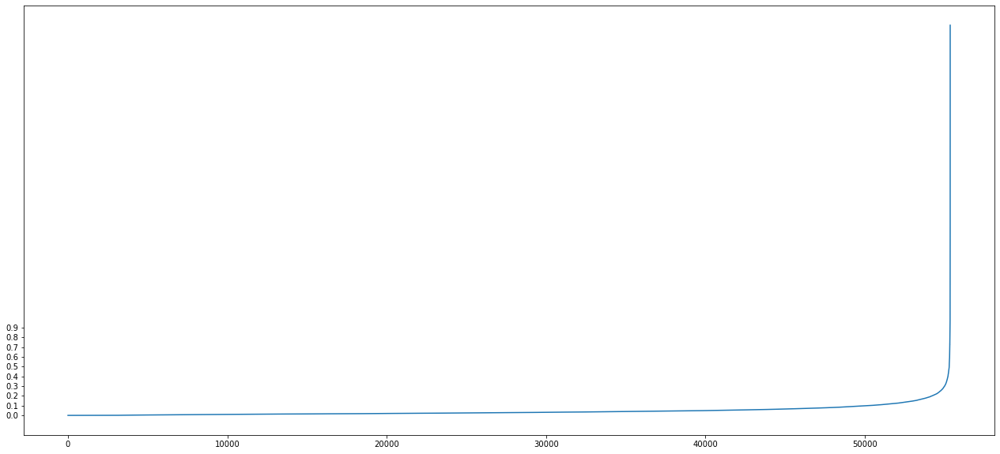

In [292]:
plt.plot(distances)
plt.yticks(np.arange(0, 1, 0.1))
plt.show()

In [293]:
fire_dbscan = DBSCAN(eps=20/6371, min_samples=50,algorithm='ball_tree', metric='haversine')

In [294]:
fire_dbscan.fit(np.radians(X_clusmap))

DBSCAN(algorithm='ball_tree', eps=0.0031392246115209545, metric='haversine',
       min_samples=50)

In [295]:
labels = fire_dbscan.labels_

In [296]:
labels

array([ 0, -1, 11, ..., -1, -1, -1], dtype=int64)

In [297]:
len(labels[labels == -1])

33953

In [298]:
# Creamos un arreglo de numpy con todos los valores en falso por default.
core_samples_mask = np.zeros_like(labels, dtype=bool)

In [299]:
# Establecemos puntos núcleo y de frontera (todos los que no son -1) a True.
core_samples_mask[fire_dbscan.core_sample_indices_] = True

In [300]:
# Acumulamos y encontramos el número de clusters (separándolos del ruido o outliers)
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)
percentage_noise_ = n_noise_ / X_clusmap.shape[0] * 100

print('Número estimado de clusters: %d' % n_clusters_)
print('Número estimado de puntos de ruido: %d' % n_noise_)
print('Porcentaje estimado de puntos de ruido: %d' % percentage_noise_)

Número estimado de clusters: 76
Número estimado de puntos de ruido: 33953
Porcentaje estimado de puntos de ruido: 61


In [301]:
#Para estos parámetros, no son demasiados clusters y son pocos puntos los que quedaron sin clúster (outliers o ruido).
#También aplicamos el coeficiente de la silueta para evaluar la calidad de los clusters de forma más objetiva. Este coeficiente tiene valores en el rango de (-1,1) donde 1 significa que los clusters están bien definidos y separados uno de otro y en -1 es todo lo contrario.

# Esta celda toma aproximadamente 4.5 minutos en ejecutarse
s = metrics.silhouette_score(X_clusmap, fire_dbscan.labels_)
print(f'Coeficiente de silueta para clusters de incendios: {s:.2f}')

Coeficiente de silueta para clusters de incendios: -0.44


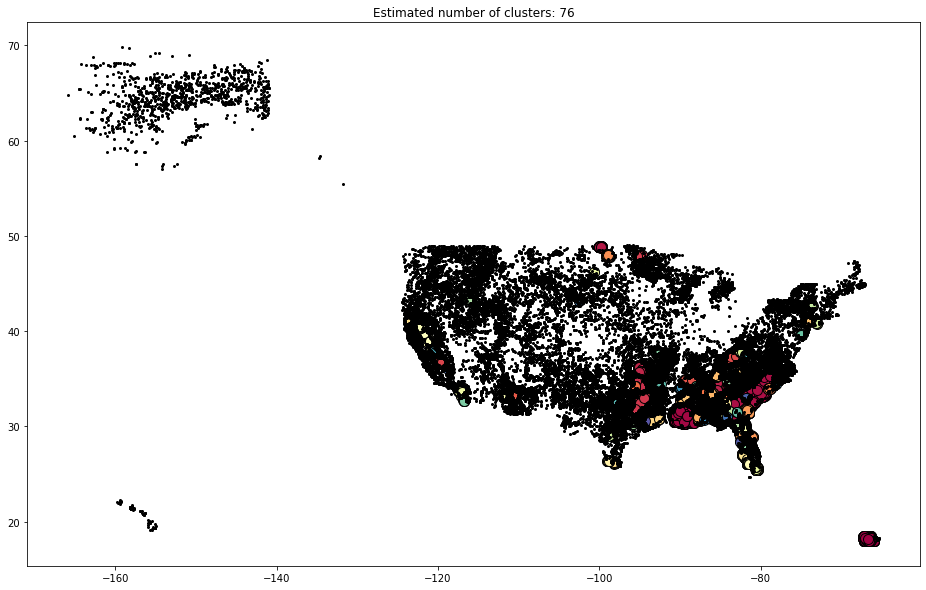

In [302]:
unique_labels = set(labels)

fig = plt.figure()
fig.set_figwidth(16)
fig.set_figheight(10)

colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))
cols = ['longitude','latitude','cluster_label']
df_ = pd.DataFrame(columns=cols)

for k, col in zip(unique_labels, colors):
    if k == -1:
        # Color negro para denotar ruido
        col = 'k'
    
    class_member_mask = (labels == k)
    xy = X_clusmap[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 1], xy[:, 0], 'o', markerfacecolor=col, markeredgecolor='k', markersize=2)

    xy = X_clusmap[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 1], xy[:, 0], 'o', markerfacecolor=col, markeredgecolor='k', markersize=10)
    
    mmm = (xy.shape[0])*[k]
    aux_df = pd.DataFrame(list(zip(xy[:, 1], xy[:, 0], mmm)), columns=cols)
    df_ = pd.concat([df_, aux_df])
  
plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

## Regresión logística

Se pretende predecir cuál es la probabilidad que tiene un incendio en ser de tipo G (el más daniño) en función de la distancia a las ciudades.

In [303]:
#Preparación de datos
X_reglog = np.array(df_pred["remoteness"]).reshape(-1,1)
y_reglog = np.array(df_pred["fire_size_class"]==5)

In [304]:
#Creamos una instancia de la Regresión Logística
regresion_logistica = LogisticRegression()

In [305]:
#Entrenamos la regresión logística con los datos de entrenamiento
regresion_logistica.fit(X_reglog,y_reglog)

LogisticRegression()

In [306]:
#Hacemos la predicción para: 3, 0.2, 0,8 y 1.5

X_nuevo = np.array([3, 0.2, 0.8, 1.5]).reshape(-1,1)

#Usamos el modelo entrenado para obtener las predicciones con datos nuevos

prediccion = regresion_logistica.predict(X_nuevo)
print(prediccion)

[ True False False False]


In [307]:
#Probabilidades de la predicción
probabilidades_prediccion = regresion_logistica.predict_proba(X_nuevo)
print(probabilidades_prediccion)

[[0.07995524 0.92004476]
 [0.96851239 0.03148761]
 [0.89738473 0.10261527]
 [0.66845762 0.33154238]]


In [308]:
#Probabilidades que un evento sea tipo G dependiendo de la distancia a la ciudad más cercana
print(probabilidades_prediccion[:,1])

[0.92004476 0.03148761 0.10261527 0.33154238]


Conclusión: 
Para entender la conclusión hay que recordar que la variable remoteness es un número adimensional que representa cuan lejos (o cerca) está el punto inicial del fuego con la ciudad más cercana.
Dicho esto, en este caso se colocan valores de 0.2 y 0.8 más cercanos a las ciudades por un lado y de 1.5 y 3 más lejanos a las ciudades. La predicción arroja que en los primeros casos (0.2 y 0.8) no se va a producir un incendio tipo G, mientras que en el segundo caso de las ciudades más lejanas se producirá un incendio tipo G.
Por último se calcularon las probabiliades para cada evento.
- Para un remoteness de 3 la probabilidad que el incendio sea de tipo G es del 92%.
- Para un remoteness de 0.2 la probabilidad que el incendio sea de tipo G es del 3%.
- Para un remoteness de 0.8 la probabilidad que el incendio sea de tipo G es del 10%.
- Para un remoteness de 1.5 la probabilidad que el incendio sea de tipo G es del 33%.

Parte de la explicación de estos datos puede ser que los incendios cerca de ciudades tienen más recursos para ser controlados, de esta forma al alejarnos de estos polos y complejizarse la situación (más recorrido, más demora en la llegada de recursos, etc.) se hace más difícil controlar un incendio, resultando como consecuencia que este se intensifique.


### General

In [309]:
#Preparación de datos
X_reglog2 = np.array(df_pred["remoteness"]).reshape(-1,1)
y_reglog2 = np.array(df_pred["fire_size_class"])

In [310]:
#Creamos una instancia de la Regresión Logística
regresion_logistica2 = LogisticRegression()

In [311]:
#Entrenamos la regresión logística con los datos de entrenamiento
regresion_logistica2.fit(X_reglog2,y_reglog2)

LogisticRegression()

In [312]:
#Hacemos la predicción para: 2, 0.1, 0,5

X_nuevo2 = np.array([2, 0.1, 0.5]).reshape(-1,1)

#Usamos el modelo entrenado para obtener las predicciones con datos nuevos

prediccion2 = regresion_logistica2.predict(X_nuevo2)
print(prediccion2)

[6 1 1]


In [313]:
#Probabilidades de la predicción
probabilidades_prediccion2 = regresion_logistica2.predict_proba(X_nuevo2)
print(probabilidades_prediccion2*100)

[[ 3.93624253  2.59471173  8.74851541 30.26928122 20.7241809  33.72706821]
 [70.0914279  19.55887934  1.88299769  0.75539229  2.51503665  5.19626613]
 [57.15836619 19.11411868  3.8903098   2.45643849  5.86229774 11.51846909]]


En este ejemplo se puede ver que para cada punto el modelo nos arroja las probabilidades que los eventos sean de cada clase

Para un remoteness de 2:
Probabilidad que el incendio sea de tipo B es del 3.93%.
Probabilidad que el incendio sea de tipo C es del 2.59%.
Probabilidad que el incendio sea de tipo D es del 8.74%.
Probabilidad que el incendio sea de tipo E es del 30.26%.
Probabilidad que el incendio sea de tipo F es del 20.72%.
Probabilidad que el incendio sea de tipo G es del 33.72%.

Para un remoteness de 0.1:
Probabilidad que el incendio sea de tipo B es del 70.1%.
Probabilidad que el incendio sea de tipo C es del 19.55%.
Probabilidad que el incendio sea de tipo D es del 1.88%.
Probabilidad que el incendio sea de tipo E es del 0.75%.
Probabilidad que el incendio sea de tipo F es del 2.51%.
Probabilidad que el incendio sea de tipo G es del 5.19%.

Para un remoteness de 0.5:
Probabilidad que el incendio sea de tipo B es del 57.15%.
Probabilidad que el incendio sea de tipo C es del 19.11%.
Probabilidad que el incendio sea de tipo D es del 3.89%.
Probabilidad que el incendio sea de tipo E es del 2.45%.
Probabilidad que el incendio sea de tipo F es del 5.86%.
Probabilidad que el incendio sea de tipo G es del 11.51%.

# Balanceo de datos

In [314]:
print(df_pred.groupby('fire_size_class').size()) 

fire_size_class
1    36522
2    10811
3     1394
4      700
5     1968
6     3972
dtype: int64


In [315]:
X_balance = df_pred.drop(['fire_size_class'], 1) #variables independientes
y_balance = df_pred['fire_size_class'] #variable dependiente, a predecir

print(X_balance.shape)
print(y_balance.shape)

(55367, 10)
(55367,)


C:\Users\Mauro\AppData\Local\Temp\ipykernel_7708\4248360343.py:1: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.



In [316]:
#Aplicamos RandomUnderSampler()
from imblearn.under_sampling import RandomUnderSampler

undersample = RandomUnderSampler(random_state=42) #undersample the majority class
X_unders, y_unders = undersample.fit_resample(X_balance, y_balance)

In [317]:
X_unders.shape
y_unders.shape

(4200,)

1    700
2    700
3    700
4    700
5    700
6    700
Name: fire_size_class, dtype: int64

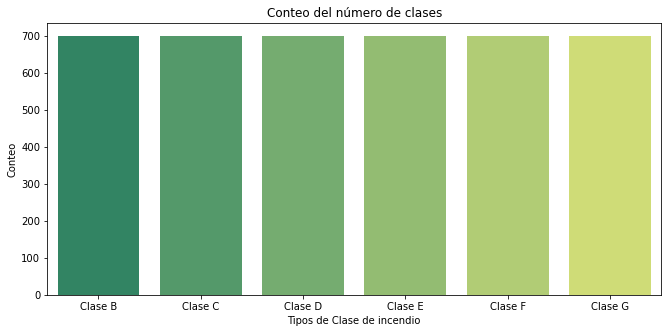

In [318]:
plt.figure(figsize=(11,5))

#Countplot en orden descendente:
fig = sns.countplot(x = y_unders, palette = "summer", order = y_unders.value_counts(ascending=False).index)

#Poner etiqueta del conteo en cada barra:
abs_values = y_unders.value_counts(ascending = False).values

#Cambiar etiquetas del eje x por el nombre de las clases en vez del número:
types_name = ['Clase B', 'Clase C', 'Clase D', 'Clase E', 'Clase F', 'Clase G']
fig.set_xticklabels(types_name)

plt.xlabel("Tipos de Clase de incendio")
plt.ylabel("Conteo")
plt.title("Conteo del número de clases")

#Tabla resumen del conteo de cada clase:
y_unders.value_counts(ascending = False) 

In [319]:
#Aplicamos SMOTE()
from imblearn.over_sampling import SMOTE

In [320]:
oversample = SMOTE(random_state=42) #undersample the majority class
X_over,y_over = oversample.fit_resample(X_balance, y_balance)

2    36522
1    36522
5    36522
3    36522
4    36522
6    36522
Name: fire_size_class, dtype: int64

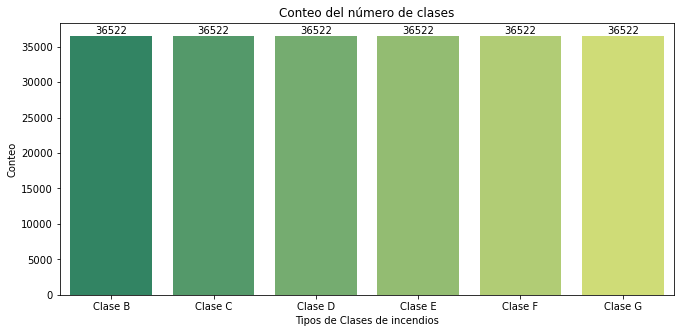

In [321]:
plt.figure(figsize=(11,5))

#Countplot en orden descendente:
fig = sns.countplot(x = y_over, palette = "summer", order = y_over.value_counts(ascending=False).index)

#Poner etiqueta del conteo en cada barra:
abs_values = y_over.value_counts(ascending = False).values
fig.bar_label(container=fig.containers[0], labels=abs_values)

#Cambiar etiquetas del eje x por el nombre de las clases en vez del número:
types_name = ['Clase B', 'Clase C', 'Clase D', 'Clase E', 'Clase F', 'Clase G']
fig.set_xticklabels(types_name)

plt.xlabel("Tipos de Clases de incendios")
plt.ylabel("Conteo")
plt.title("Conteo del número de clases")

#Tabla resumen del conteo de cada clase:
y_over.value_counts(ascending = False) 

## Separación de los datos en train y test

### Full Model - con los datos originales

In [322]:
from sklearn.model_selection import train_test_split
from sklearn import model_selection

In [323]:
test_size = 0.20 #20% de datos para el test
seed = 7
X_train_balance, X_test_balance, y_train_balance, y_test_balance = model_selection.train_test_split(X_balance, y_balance, test_size = test_size, random_state = 42)

print('Dimensiones de X_train:', X_train_balance.shape, '; Dimensiones de y_train:', y_train_balance.shape)
print('Dimensiones de X_test:', X_test_balance.shape, '; Dimensiones de y_test:', y_test_balance.shape)

Dimensiones de X_train: (44293, 10) ; Dimensiones de y_train: (44293,)
Dimensiones de X_test: (11074, 10) ; Dimensiones de y_test: (11074,)


In [324]:
#Comprobamos que el total sume la longitud del set de datos original
X_train_balance.shape[0] + X_test_balance.shape[0]

55367

### RandomUnderSampler - con el target balanceado

In [325]:
test_size = 0.20 
seed = 7
X_train_resbalance, X_test_resbalance, y_train_resbalance, y_test_resbalance = model_selection.train_test_split(X_unders,
                                                                    y_unders,
                                                                    test_size = test_size,
                                                                    random_state = seed)

### SMOTE() - con el target balanceado

In [326]:
test_size = 0.20 
seed = 7
X_train_resbalance, X_test_resbalance, y_train_resbalance, y_test_resbalance = model_selection.train_test_split(X_over,
                                                                    y_over,
                                                                    test_size = test_size,
                                                                    random_state = seed)

# Machine Learning

In [327]:
#Estandarización:
std_scale = preprocessing.StandardScaler().fit(X_train_resbalance)

X_train = std_scale.transform(X_train_resbalance)
X_test = std_scale.transform(X_test_resbalance)

## Feature Selection

Obtener la máxima información con el mínimo uso de recursos. Encontrar un modelo sencillo con menos variables que tenga un alto poder explicativo. Se aplican métodos de Feature Selection.

### Random Forest Selection

In [328]:
#Aplicamos Random Forest Selection
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(n_jobs=-1)
rf_clf.fit(X_train_resbalance, y_train_resbalance)
y_pred = rf_clf.predict(X_test_resbalance)

In [329]:
print("Total precision: " + str(1 - np.count_nonzero(y_test_resbalance - y_pred) / len(y_test_resbalance - y_pred)))

Total precision: 0.891048896798777


In [330]:
#Errores
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_resbalance, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_resbalance, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_resbalance, y_pred)))

Mean Absolute Error: 0.14112305199990874
Mean Squared Error: 0.23220845597462753
Root Mean Squared Error: 0.481880126146148


<AxesSubplot:title={'center':'Top important features'}>

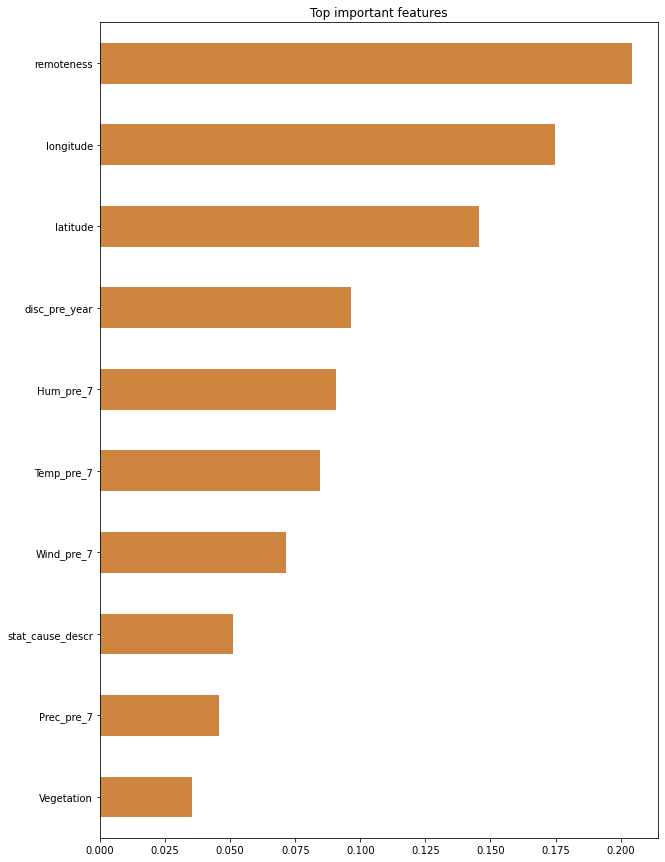

In [331]:
features = df_pred.drop(["fire_size_class"], axis = 1).columns

feat_importances = pd.Series(rf_clf.feature_importances_, index=features)

feat_importances.nlargest(30).iloc[::-1].plot(kind='barh', figsize=[10, 15], title="Top important features", color ='peru')

### PCA

In [332]:
X_pca = df_pred.drop('fire_size_class', 1)
y_pca = df_pred['fire_size_class']

C:\Users\Mauro\AppData\Local\Temp\ipykernel_7708\3875239107.py:1: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.



In [333]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

pca_pipe = make_pipeline(StandardScaler(), PCA())
pca_pipe.fit(X_pca)

Pipeline(steps=[('standardscaler', StandardScaler()), ('pca', PCA())])

In [334]:
pca = pca_pipe.named_steps['pca']
print('Porcentaje de varianza explicada por cada componente', pca.explained_variance_ratio_)

Porcentaje de varianza explicada por cada componente [0.25483498 0.22014998 0.10272529 0.10107924 0.09272119 0.08485931
 0.06654759 0.03702904 0.02514039 0.01491299]


Text(0, 0.5, 'cumulative explained variance')

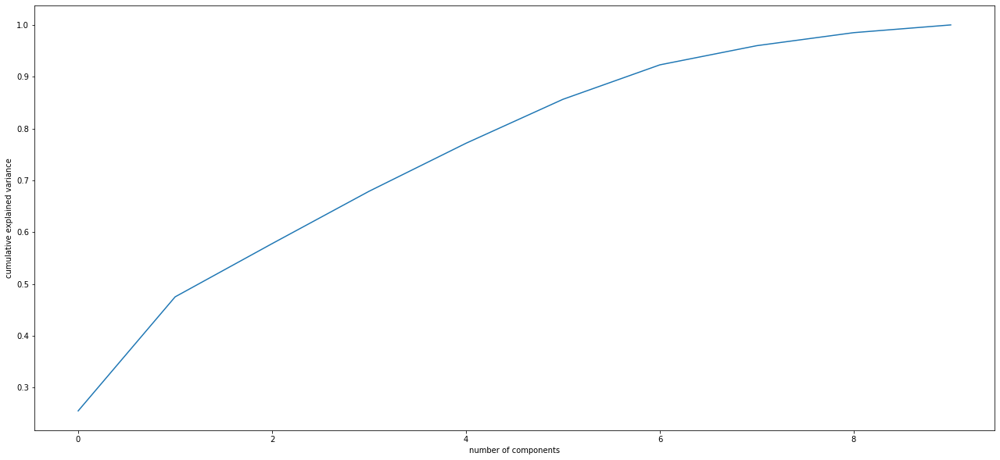

In [335]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [336]:
#Todas las componentes que tengan un % de la varianza acumulada de 0.80 %. 
np.cumsum(pca.explained_variance_ratio_) 

array([0.25483498, 0.47498496, 0.57771025, 0.67878949, 0.77151068,
       0.85636999, 0.92291758, 0.95994662, 0.98508701, 1.        ])

Al usar una PCA como método para Feature Selection, no hay una respuesta clara sobre dónde se encuentra el límite de la varianza. Sin embargo, teniendo en cuenta que el número de componentes principales, muchos de ellos contribuyen de manera insignificante a la varianza proporcional. Se decide poner el umbral en el 80% de la varianza proporcional, lo que selecciona los primeros 6 componentes principales.

## Random Forest Classifier:

In [337]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, roc_curve


rnd_clf = RandomForestClassifier(random_state= 42, n_jobs = -1)
rnd_clf.fit(X_train_resbalance, y_train_resbalance)

RandomForestClassifier(n_jobs=-1, random_state=42)

Total accuracy: 0.8898167796107422
98132     3
141565    4
36036     1
161329    5
48946     2
         ..
64691     2
203233    6
126530    4
62635     2
88704     3
Name: fire_size_class, Length: 43827, dtype: int64 [3 4 1 ... 3 1 3]


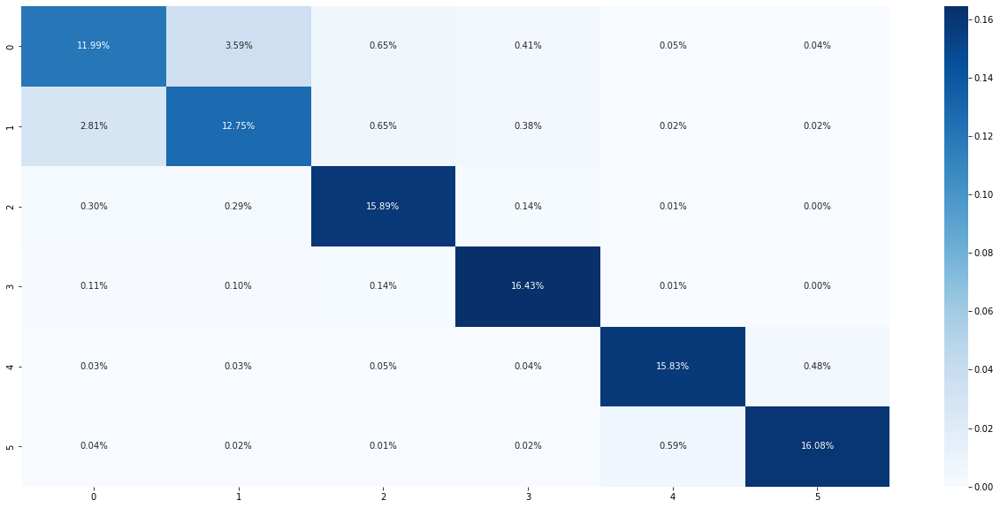

In [338]:
# RandomForestClassifier - metrics
y_pred_rf = rnd_clf.predict(X_test_resbalance)
print("Total accuracy:", accuracy_score(y_test_resbalance, y_pred_rf))

c_matrix = confusion_matrix(y_test_resbalance, y_pred_rf)
sns.heatmap(c_matrix/np.sum(c_matrix), annot=True, 
            fmt='.2%', cmap='Blues');

print(y_test_resbalance, y_pred_rf)

In [339]:
#Errores
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_resbalance, y_pred_rf))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_resbalance, y_pred_rf))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_resbalance, y_pred_rf)))

Mean Absolute Error: 0.1436329203459055
Mean Squared Error: 0.23891664955392794
Root Mean Squared Error: 0.4887910080534706


In [340]:
#Nos centramos en crear el mejor clasificador.
# Buscamos los mejores parámetros, hacemos un cross-validation y pruebamos con el target balanceado (X_unders, y_unders)

from sklearn.model_selection import GridSearchCV

rand_forest = RandomForestClassifier()

rand_forest_param = {
    'n_estimators': [400, 600, 800], 
    'max_features': [2, 4, 6]} 

gs_rand_forest = GridSearchCV(rand_forest,
                         rand_forest_param,
                         cv=10,
                         verbose=1,
                         n_jobs=-1)
                         
grids = {"gs_rand_forest": gs_rand_forest}

In [341]:
#X_train y_train vienen de X_unders, y_unders (RandomUnderSampler: minimiza las clases mayoritarias)

for i,j in grids.items():
    j.fit(X_unders, y_unders) 

Fitting 10 folds for each of 9 candidates, totalling 90 fits


In [342]:
#X_train y_train vienen de X_overs, y_overs (SMOTE(): aumenta las clases minoritarias)
#Tarda mucho la ejecucion

for i,j in grids.items():
    j.fit(X_over, y_over) 

Fitting 10 folds for each of 9 candidates, totalling 90 fits


C:\Users\Mauro\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning:


5 fits failed out of a total of 90.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Mauro\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Mauro\AppData\Roaming\Python\Python39\site-packages\sklearn\ensemble\_forest.py", line 476, in fit
    trees = Parallel(
  File "c:\ProgramData\Anaconda3\lib\site-packages\joblib\parallel.py", line 1046, in __call__
    while self.dispatch_one_batch(iterator

In [343]:
best_grids = [(i, j.best_score_) for i, j in grids.items()]

best_grids = pd.DataFrame(best_grids,
columns = ["Grid", "Best Score"]).sort_values("Best Score", ascending=False)
best_grids

,Grid,Best Score
0,gs_rand_forest,0.904743


In [344]:
gs_rand_forest.best_estimator_

RandomForestClassifier(max_features=2, n_estimators=600)

In [345]:
#Ahora probamos con los parámetros mejores:
rnd_clf_best = RandomForestClassifier(max_features=6, n_estimators=600, random_state= 42, n_jobs = -1)
rnd_clf_best.fit(X_train_resbalance, y_train_resbalance)

RandomForestClassifier(max_features=6, n_estimators=600, n_jobs=-1,
                       random_state=42)

In [346]:
from sklearn.metrics import classification_report

In [347]:
#Y hacemos las predicciones:
y_pred_rf_best = rnd_clf_best.predict(X_test_resbalance)
print("Total accuracy:", accuracy_score(y_test_resbalance, y_pred_rf_best))
print(classification_report(y_test_resbalance, y_pred_rf_best))

Total accuracy: 0.8888584662422707
              precision    recall  f1-score   support

           1       0.79      0.72      0.75      7338
           2       0.76      0.76      0.76      7288
           3       0.91      0.95      0.93      7285
           4       0.94      0.98      0.96      7357
           5       0.96      0.96      0.96      7218
           6       0.97      0.96      0.96      7341

    accuracy                           0.89     43827
   macro avg       0.89      0.89      0.89     43827
weighted avg       0.89      0.89      0.89     43827



In [348]:
#Errores
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_resbalance, y_pred_rf_best))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_resbalance, y_pred_rf_best))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_resbalance, y_pred_rf_best)))

Mean Absolute Error: 0.14420334496999568
Mean Squared Error: 0.23574508864398658
Root Mean Squared Error: 0.48553587781335644


Como da un scoring bueno, no se hace la predicción con datos de entrada con reducción por PCA y Random Forest Selection.

## Regresión logística

Se prueba con la Regresión Logística, un algoritmo de clasificación supervisada.Se aplica para multiclase ya que el algoritmo utiliza la estrategia (One vs Rest). Cada uno de los modelos da la probabilidad de pertenencia a cada clase. La clase ganadora de la predicción será la que tenga una mayor probabilidad.

### Full model (sin reducción de dimensiones). Para ver cómo predice con los datos originales:

In [349]:
#LogisticRegression - Full Model
from sklearn import linear_model
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix


log_clf = linear_model.LogisticRegression(random_state= 42, n_jobs = -1) #max_iter = 1000; 10000
log_clf.fit(X_train_resbalance, y_train_resbalance)

LogisticRegression(n_jobs=-1, random_state=42)

Total accuracy: 0.3078011271590572
              precision    recall  f1-score   support

           1       0.31      0.59      0.41      7338
           2       0.28      0.19      0.23      7288
           3       0.24      0.10      0.14      7285
           4       0.26      0.16      0.20      7357
           5       0.27      0.25      0.26      7218
           6       0.38      0.56      0.45      7341

    accuracy                           0.31     43827
   macro avg       0.29      0.31      0.28     43827
weighted avg       0.29      0.31      0.28     43827



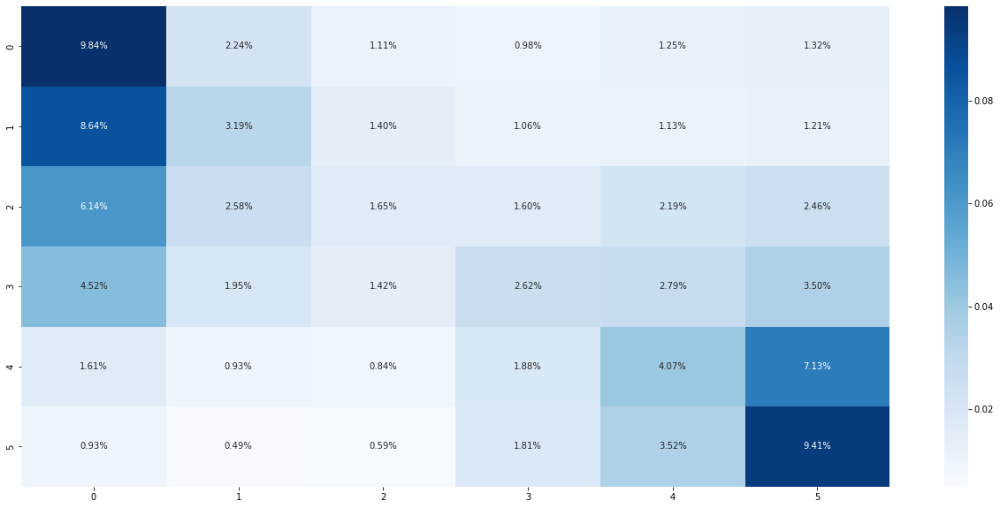

In [350]:
# LogisticRegression - metrics
y_pred_log = log_clf.predict(X_test_resbalance)
print("Total accuracy:", accuracy_score(y_test_resbalance, y_pred_log))

c_matrix = confusion_matrix(y_test_resbalance, y_pred_log)
sns.heatmap(c_matrix/np.sum(c_matrix), annot=True, 
            fmt='.2%', cmap='Blues');

print(classification_report(y_test_resbalance, y_pred_log))

In [351]:
#Errores
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_resbalance, y_pred_log))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_resbalance, y_pred_log))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_resbalance, y_pred_log)))

Mean Absolute Error: 1.3173158098888813
Mean Squared Error: 3.323658931708764
Root Mean Squared Error: 1.823090489171825


### Predicción con datos de entrada con reducción de dimensiones por PCA. Para ver si mejora

In [352]:
#PCA para ver si mejora la LogisticRegression
X_PCA = X_pca.iloc[:,:10] #las columnas
X_PCA.head()

,stat_cause_descr,latitude,longitude,disc_pre_year,Vegetation,Temp_pre_7,Wind_pre_7,Hum_pre_7,Prec_pre_7,remoteness
0,5,18.105072,-66.753044,2007,12,24.902597,3.262092,76.381579,0.0,0.017923
1,2,35.038330,-87.610000,2006,15,0.343529,1.976471,55.505882,0.0,0.184355
2,2,34.947800,-88.722500,2004,16,5.558750,2.695833,76.812834,18.1,0.194544
3,1,39.641400,-119.308300,2005,0,18.142564,3.671282,35.353846,0.0,0.487447
4,3,30.700600,-90.591400,1999,12,-1.000000,-1.000000,-1.000000,-1.0,0.214633


In [353]:
test_size = 0.20 
seed = 7
X_train_pca, X_test_pca, y_train_pca, y_test_pca = model_selection.train_test_split(X_PCA, y_pca, test_size = test_size, random_state = 42)

#Ahora el dataset tiene 10 columnas
print('Dimensiones de X_train:', X_train_pca.shape, '; Dimensiones de y_train:', y_train_pca.shape)
print('Dimensiones de X_test:', X_test_pca.shape, '; Dimensiones de y_test:', y_test_pca.shape)

Dimensiones de X_train: (44293, 10) ; Dimensiones de y_train: (44293,)
Dimensiones de X_test: (11074, 10) ; Dimensiones de y_test: (11074,)


In [354]:
#Estandarización:
std_scale = preprocessing.StandardScaler().fit(X_train_pca)

X_train_pca_std = std_scale.transform(X_train_pca)
X_test_pca_std = std_scale.transform(X_test_pca)

In [355]:
#LogisticRegression con datos de entrada de PCA
log_clf_pca = linear_model.LogisticRegression(random_state= 42, n_jobs = -1) #max_iter = 1000; 10000
log_clf_pca.fit(X_train_pca_std, y_train_pca)

LogisticRegression(n_jobs=-1, random_state=42)

Total accuracy: 0.705526458370959
              precision    recall  f1-score   support

           1       0.70      1.00      0.83      7273
           2       0.00      0.00      0.00      2176
           3       0.00      0.00      0.00       275
           4       0.00      0.00      0.00       139
           5       0.00      0.00      0.00       398
           6       0.73      0.68      0.70       813

    accuracy                           0.71     11074
   macro avg       0.24      0.28      0.26     11074
weighted avg       0.52      0.71      0.59     11074



C:\Users\Mauro\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Mauro\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Mauro\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



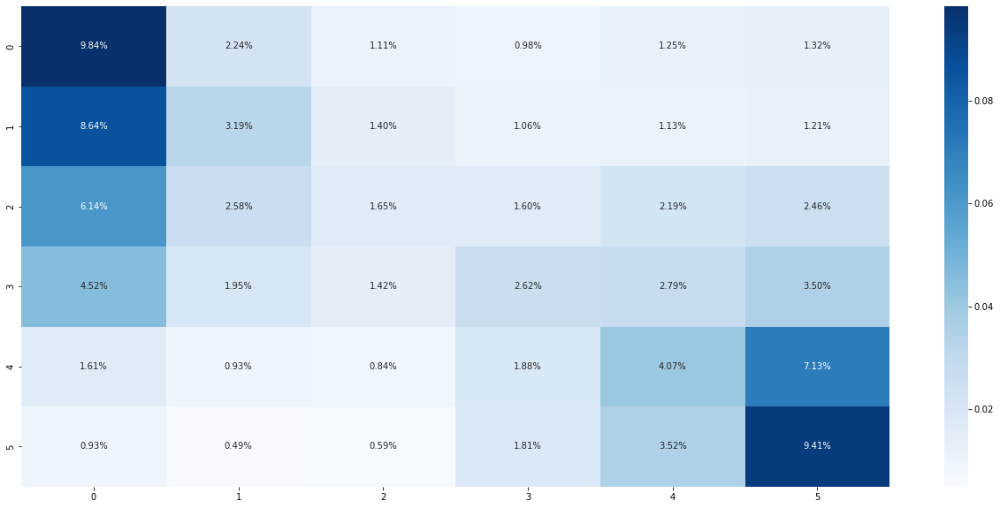

In [356]:
# LogisticRegression - metrics con datos de entrada de PCA
y_pred_log_pca = log_clf_pca.predict(X_test_pca_std)
print("Total accuracy:", accuracy_score(y_test_pca, y_pred_log_pca))

c_matri_pca = confusion_matrix(y_test_pca, y_pred_log_pca)
sns.heatmap(c_matrix/np.sum(c_matrix), annot=True, 
            fmt='.2%', cmap='Blues');

print(classification_report(y_test_pca, y_pred_log_pca))

In [357]:
#Errores
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_pca, y_pred_log_pca))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_pca, y_pred_log_pca))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_pca, y_pred_log_pca)))

Mean Absolute Error: 0.504424778761062
Mean Squared Error: 1.367888748419722
Root Mean Squared Error: 1.1695677613630269


### Predicción con datos de entrada con reducción de variables mediante Variable Importance de Random Forest Selection. Para ver si mejora

In [358]:
#Dataset Selection Random Forest
X_rf = X_forest

In [359]:
X_rf #asegurar que no está Slope ni Forest_Cover_Type

,stat_cause_descr,latitude,longitude,disc_pre_year,Vegetation,Temp_pre_7,Wind_pre_7,Hum_pre_7,Prec_pre_7,remoteness
0,5,18.105072,-66.753044,2007,12,24.902597,3.262092,76.381579,0.0,0.017923
1,2,35.038330,-87.610000,2006,15,0.343529,1.976471,55.505882,0.0,0.184355
2,2,34.947800,-88.722500,2004,16,5.558750,2.695833,76.812834,18.1,0.194544
3,1,39.641400,-119.308300,2005,0,18.142564,3.671282,35.353846,0.0,0.487447
4,3,30.700600,-90.591400,1999,12,-1.000000,-1.000000,-1.000000,-1.0,0.214633
...,...,...,...,...,...,...,...,...,...,...
55362,5,39.180000,-96.784167,2015,0,18.918994,3.196648,54.625698,0.0,0.331501
55363,5,38.342719,-120.695967,2015,0,-1.000000,-1.000000,-1.000000,-1.0,0.124683
55364,2,37.262607,-119.511139,2015,0,28.166667,2.667722,44.443975,0.0,0.097682
55365,3,40.604300,-123.080450,2015,15,-1.000000,-1.000000,-1.000000,-1.0,0.178206


In [360]:
test_size = 0.20 #20% de datos para el test
seed = 7
X_train_rf, X_test_rf, y_train_rf, y_test_rf = model_selection.train_test_split(X_rf, y_forest, test_size = test_size, random_state = 42)

#Ahora el dataset tiene 10 columnas
print('Dimensiones de X_train:', X_train_rf.shape, '; Dimensiones de y_train:', y_train_rf.shape)
print('Dimensiones de X_test:', X_test_rf.shape, '; Dimensiones de y_test:', y_test_rf.shape)

Dimensiones de X_train: (44293, 10) ; Dimensiones de y_train: (44293,)
Dimensiones de X_test: (11074, 10) ; Dimensiones de y_test: (11074,)


In [361]:
#Estandarización:
std_scale = preprocessing.StandardScaler().fit(X_train_rf)

X_train_rf_std = std_scale.transform(X_train_rf)
X_test_rf_std = std_scale.transform(X_test_rf)

In [362]:
#LogisticRegression con datos de entrada de PCA
log_clf_rf = linear_model.LogisticRegression(random_state= 42, n_jobs = -1) #max_iter = 1000; 10000
log_clf_rf.fit(X_train_rf_std, y_train_rf)

LogisticRegression(n_jobs=-1, random_state=42)

Total accuracy: 0.705526458370959
              precision    recall  f1-score   support

           1       0.70      1.00      0.83      7273
           2       0.00      0.00      0.00      2176
           3       0.00      0.00      0.00       275
           4       0.00      0.00      0.00       139
           5       0.00      0.00      0.00       398
           6       0.73      0.68      0.70       813

    accuracy                           0.71     11074
   macro avg       0.24      0.28      0.26     11074
weighted avg       0.52      0.71      0.59     11074



C:\Users\Mauro\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Mauro\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Mauro\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



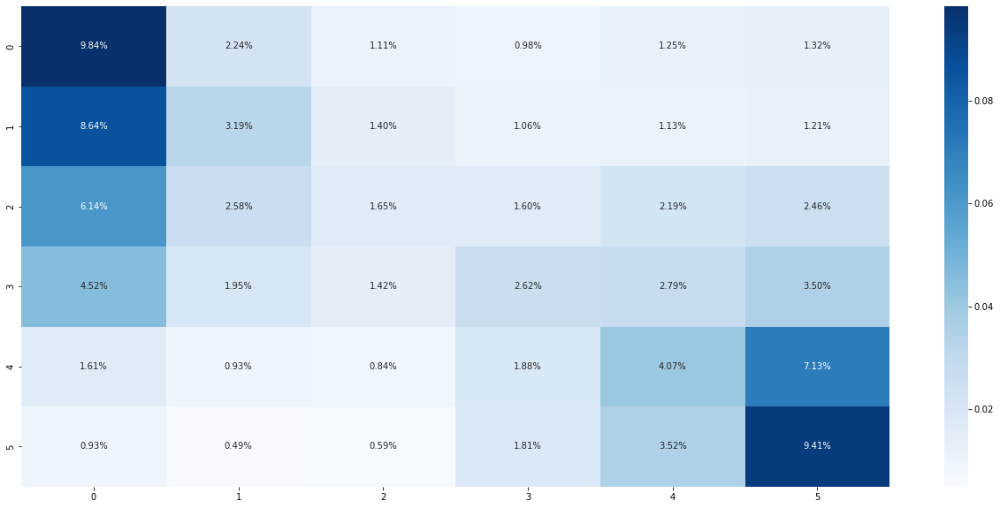

In [363]:
# LogisticRegression - metrics con datos de entrada de PCA
y_pred_log_rf = log_clf_rf.predict(X_test_rf_std)
print("Total accuracy:", accuracy_score(y_test_rf, y_pred_log_rf))

c_matri_pca = confusion_matrix(y_test_rf, y_pred_log_rf)
sns.heatmap(c_matrix/np.sum(c_matrix), annot=True, 
            fmt='.2%', cmap='Blues');

print(classification_report(y_test_rf, y_pred_log_rf))

In [364]:
#Errores
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_rf, y_pred_log_rf))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_rf, y_pred_log_rf))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_log_rf)))

Mean Absolute Error: 0.504424778761062
Mean Squared Error: 1.367888748419722
Root Mean Squared Error: 1.1695677613630269


## Árboles de Decisión

Algoritmo en el que se divide el espacio muestral con la variable más predictiva (la que mejor separa los datos). Tras esta división, el árbol se vuelve a dividir en el siguiente nivel con la variable que mejor separa los datos del nodo.

Y así, hasta que se alcanza un criterio de parada: 1- Están todos los elementos clasificados perfectamente (WARNING) 2- No puede encontrar una división que reduzca la impureza del nodo. 3- El árbol alcanza un tamaño predefinido.

Los árboles de decisión hacen muy pocas suposiciones sobre los datos de entrenamiento, a diferencia de los modelos lineales, que asumen que los datos tienen una relación lineal, por ejemplo. Por lo tanto, la estructura del modelo es libre para ajustarse todo lo posible a los datos de entrenamiento. Si no se limita la dimensión del árbol, se producirá muy probablemente overfitting.

In [365]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score 

tree = DecisionTreeClassifier()

tree.fit(X_train_resbalance, y_train_resbalance)

parameters = {'max_depth': [2,3,4,5,6,7], 'min_samples_leaf': np.arange(1,7)}

grid_tree = GridSearchCV(tree, parameters, scoring = 'accuracy', cv = 5) #cross validation. Usando CV, la métrica es más realista

grid_tree.fit(X_train_resbalance, y_train_resbalance) #Full model. Datos originales estandarizados
print(grid_tree.best_score_) #¿cual es la accuracy más alta?
print(grid_tree.best_params_) #con qué parámetros?

0.45190382476255664
{'max_depth': 7, 'min_samples_leaf': 1}


In [366]:
#En la celda anterior da los parámetros del mejor scoring, se aplican ahora: 
tree = DecisionTreeClassifier(max_depth = 7, min_samples_leaf= 1, random_state = 42) 
tree.fit(X_train_resbalance, y_train_resbalance)

tree_predictions = tree.predict(X_test_resbalance)
accuracy_score(y_test_resbalance, tree_predictions) 

0.44878727724918427

In [367]:
#Errores
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_resbalance, tree_predictions))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_resbalance, tree_predictions))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_resbalance, tree_predictions)))

Mean Absolute Error: 0.7950578410568827
Mean Squared Error: 1.4518675702192712
Root Mean Squared Error: 1.2049346746688268


## KNN

In [368]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors = 7)
knn.fit(X_train_resbalance, y_train_resbalance) #Full model. Datos originales estandarizados

KNeighborsClassifier(n_neighbors=7)

In [369]:
#Pruebamos hacerlo con el target balanceado por RandomUnderSampler 
from sklearn.metrics import classification_report, accuracy_score
knn = KNeighborsClassifier(n_neighbors = 7)

knn.fit(X_train_resbalance, y_train_resbalance) #viene de X_unders, y_unders
prediction = knn.predict(X_test_resbalance) 

print(accuracy_score(y_test_resbalance, prediction)) 
print(classification_report(y_test_resbalance, prediction))

0.8087936660049742
              precision    recall  f1-score   support

           1       0.74      0.45      0.56      7338
           2       0.67      0.70      0.68      7288
           3       0.82      0.93      0.87      7285
           4       0.87      0.96      0.91      7357
           5       0.85      0.91      0.88      7218
           6       0.86      0.90      0.88      7341

    accuracy                           0.81     43827
   macro avg       0.80      0.81      0.80     43827
weighted avg       0.80      0.81      0.80     43827



In [370]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_resbalance, prediction))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_resbalance, prediction))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_resbalance, prediction)))

Mean Absolute Error: 0.3577018732744655
Mean Squared Error: 0.954548565952495
Root Mean Squared Error: 0.9770100132304147


In [371]:
df_pred.head()

,fire_size_class,stat_cause_descr,latitude,longitude,disc_pre_year,Vegetation,Temp_pre_7,Wind_pre_7,Hum_pre_7,Prec_pre_7,remoteness
0,2,5,18.105072,-66.753044,2007,12,24.902597,3.262092,76.381579,0.0,0.017923
1,1,2,35.038330,-87.610000,2006,15,0.343529,1.976471,55.505882,0.0,0.184355
2,2,2,34.947800,-88.722500,2004,16,5.558750,2.695833,76.812834,18.1,0.194544
3,1,1,39.641400,-119.308300,2005,0,18.142564,3.671282,35.353846,0.0,0.487447
4,1,3,30.700600,-90.591400,1999,12,-1.000000,-1.000000,-1.000000,-1.0,0.214633


In [372]:
X = df_pred.drop('fire_size_class', 1)
y = df_pred['fire_size_class']

C:\Users\Mauro\AppData\Local\Temp\ipykernel_7708\2033112792.py:1: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.



In [373]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [374]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [375]:
from sklearn.decomposition import PCA

pca = PCA()
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

In [376]:
explained_variance = pca.explained_variance_ratio_
explained_variance

array([0.25524302, 0.21938673, 0.10256889, 0.10111423, 0.09279065,
       0.08472092, 0.06704207, 0.03707769, 0.02518771, 0.01486808])

In [377]:
#Realizamos un random forest con el resultado del analisis PCA, es este caso
# Tomamos los 5 primeros componentes que representan un % alto de la variabilidad 
from sklearn.decomposition import PCA
pca = PCA(n_components=5)
X_train2 = pca.fit_transform(X_train)
X_test2 = pca.transform(X_test)

In [378]:
# Creación del modelo
model_rf = RandomForestClassifier(max_depth=2, random_state=0)
model_rf.fit(X_train2, y_train)

# Predicción
y_pred = model_rf.predict(X_test2)

In [379]:
accuracy = accuracy_score(y_test, y_pred)
print('El accuracy del modelo es:', accuracy)

El accuracy del modelo es: 0.6675997832761423


Para la búsqueda de generar una regresión lineal vamos a hacer uso del dataset completo.

In [380]:
dfx=df_pred[['Temp_pre_7', 'Wind_pre_7', 'Hum_pre_7', 'Prec_pre_7', 'remoteness']]
dfy=df_pred[['fire_size_class']]

In [381]:
X_train_rl, X_test_rl, y_train_rl, y_test_rl = train_test_split(dfx, dfy, test_size=0.3)

In [382]:
logreg = LogisticRegression()
logreg.fit(X_train_rl, y_train_rl)

C:\Users\Mauro\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Mauro\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

El score que se está dando es muy alto, pero como se verá a continuación el porcentaje de error que puede dar es considerable.

In [383]:
y_pred = logreg.predict(X_test_rl)
logreg.score(X_test_rl, y_test_rl)

0.6550478598519054

A pesar de tener un 66% de puntaje, la cantidad de Falsos Positivos es muy elevada, siendo que los eventos clasificados fueron mayormente correctos. 

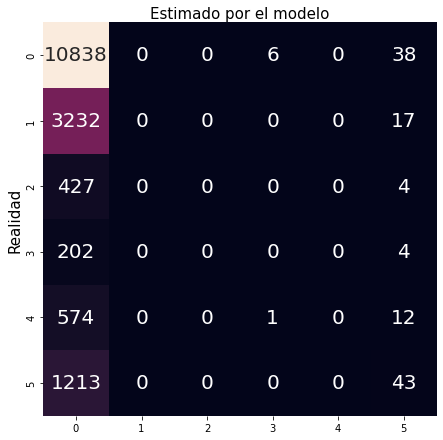

In [384]:
cnf_matrix = metrics.confusion_matrix(y_test_rl, y_pred)
class_names=[0,1]
tick_marks = np.arange(len(class_names))

fig, ax = plt.subplots(figsize=(6, 6))

plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

sns.heatmap(pd.DataFrame(cnf_matrix), annot=True ,fmt='g', cbar=False, annot_kws={"size": 20})
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.ylabel('Realidad', fontsize=15, y=0.5)
plt.xlabel('Estimado por el modelo', fontsize=15);

## Random Forest Classifier:

In [391]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, roc_curve


rnd_clf = RandomForestClassifier(random_state= 42, n_jobs = -1)
rnd_clf.fit(X_train_resbalance, y_train_resbalance)

RandomForestClassifier(n_jobs=-1, random_state=42)

Total accuracy: 0.8898167796107422
98132     3
141565    4
36036     1
161329    5
48946     2
         ..
64691     2
203233    6
126530    4
62635     2
88704     3
Name: fire_size_class, Length: 43827, dtype: int64 [3 4 1 ... 3 1 3]


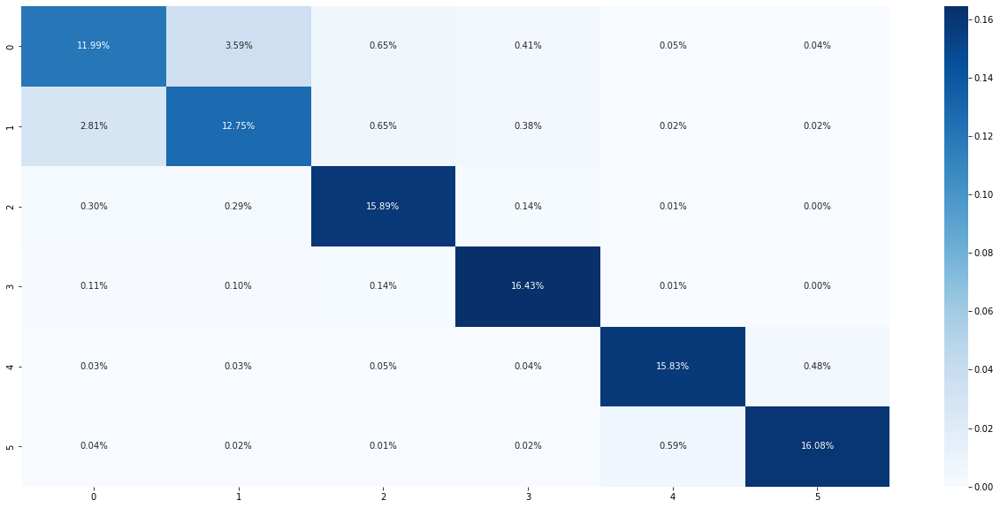

In [392]:
# RandomForestClassifier - metrics
y_pred_rf = rnd_clf.predict(X_test_resbalance)
print("Total accuracy:", accuracy_score(y_test_resbalance, y_pred_rf))

c_matrix = confusion_matrix(y_test_resbalance, y_pred_rf)
sns.heatmap(c_matrix/np.sum(c_matrix), annot=True, 
            fmt='.2%', cmap='Blues');

print(y_test_resbalance, y_pred_rf)

In [393]:
from sklearn import metrics
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [394]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_resbalance, y_pred_rf))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_resbalance, y_pred_rf))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_resbalance, y_pred_rf)))

Mean Absolute Error: 0.1436329203459055
Mean Squared Error: 0.23891664955392794
Root Mean Squared Error: 0.4887910080534706


In [395]:
#Nos centramos en crear el mejor clasificador.
# Buscamos los mejores parámetros, hacemos un cross-validation y pruebamos con el target balanceado (X_unders, y_unders)

from sklearn.model_selection import GridSearchCV

rand_forest = RandomForestClassifier()

rand_forest_param = {
    'n_estimators': [400, 600, 800], 
    'max_features': [2, 4, 6]} 

gs_rand_forest = GridSearchCV(rand_forest,
                         rand_forest_param,
                         cv=10,
                         verbose=1,
                         n_jobs=-1)
                         
grids = {"gs_rand_forest": gs_rand_forest}

In [396]:
#Y hacemos las predicciones:
y_pred_rf_best = rnd_clf_best.predict(X_test_resbalance)
print("Total accuracy:", accuracy_score(y_test_resbalance, y_pred_rf_best))
print(classification_report(y_test_resbalance, y_pred_rf_best))

Total accuracy: 0.8888584662422707
              precision    recall  f1-score   support

           1       0.79      0.72      0.75      7338
           2       0.76      0.76      0.76      7288
           3       0.91      0.95      0.93      7285
           4       0.94      0.98      0.96      7357
           5       0.96      0.96      0.96      7218
           6       0.97      0.96      0.96      7341

    accuracy                           0.89     43827
   macro avg       0.89      0.89      0.89     43827
weighted avg       0.89      0.89      0.89     43827



In [397]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_resbalance, y_pred_rf_best))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_resbalance, y_pred_rf_best))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_resbalance, y_pred_rf_best)))

Mean Absolute Error: 0.14420334496999568
Mean Squared Error: 0.23574508864398658
Root Mean Squared Error: 0.48553587781335644
